In [1]:
# w = 15 로 돌려보자
# lr = 0.0001
# lambda_1 = 1
# h = 128
# loss 0.7밑으로 안내려갑니다...

# temporal lstm을 multi-head attention으로 구현해보자 -> 하지 않음

In [2]:
# 모듈 import
from datetime import datetime
import numpy as np
import os
import pandas as pd
import seaborn as sns

#from google.colab import drive
#drive.mount('/content/gdrive')
#os.chdir('/content/gdrive/MyDrive/python/python_dong/data_axis_transform1')

import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
from torch.autograd import Variable

#!pip install torchmetrics
import torchmetrics

#!pip install torchinfo
from torchinfo import summary

import matplotlib.pyplot as plt
import math


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



# 1. 데이터 전처리

In [3]:
# data path 지정
raw_data_path = './data/stocknet-dataset/price/raw'

if 'stocknet' in raw_data_path:
    tra_date = '2014-01-02'
    val_date = '2015-08-03'
    tes_date = '2015-10-01'
    end_date = '2015-12-31'
elif 'kdd17' in raw_data_path:
    tra_date = '2007-01-03'
    val_date = '2015-01-02'
    tes_date = '2016-01-04'
    end_date = '2016-12-31'
else:
    print('unexpected path: %s' % raw_data_path)

# os.path.isfile : 파일이 있는지 없는 지 체크
# os.path.join(data_path, fname) : 폴더 디렉터리와 fname(stockname.csv) 붙임
fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

COLUMNS_FEATURE_DATA_V1 = ['open_close_ratio', 'high_close_ratio', 
                           'low_close_ratio', 'close_lastclose_ratio', 
                           'adjclose_lastadjclose_ratio', 'close_ma5_ratio', 
                           'close_ma10_ratio', 'close_ma15_ratio', 'close_ma20_ratio', 
                           'close_ma25_ratio', 'close_ma30_ratio']

ver = 'v1' # ver in ['v1', 'v2']
if ver == 'v1':
    COLUMNS_FEATURE = COLUMNS_FEATURE_DATA_V1

In [4]:
windows = [5,10,15,20,25,30]

def preprocess(df, windows):
   '''
   전처리 함수 역할 : 전체 feature생성하여 df column에 추가
   '''
   data = df
   data['open_close_ratio'] = data['Open'] / data['Close'] - 1
   data['high_close_ratio'] = data['High'] / data['Close'] - 1
   data['low_close_ratio'] = data['Low'] / data['Close'] - 1

   data['close_lastclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'close_lastclose_ratio'] = data['Close'][1:].values / data['Close'][:-1].values - 1

   data['adjclose_lastadjclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'adjclose_lastadjclose_ratio'] = data['Adj Close'][1:].values / data['Adj Close'][:-1].values - 1

   for window in windows:
      data[f'close_ma{window}_ratio'] = data['Adj Close'].rolling(window).mean()/data['Adj Close'] - 1
   
   data['label'] = np.append((data['Close'][1:].values > data['Close'][:-1].values)*1,0)

   return data

In [5]:
feature_data_path = './data/stocknet-dataset/price/feature'

for fname in fnames:
   if not os.path.isfile(os.path.join(feature_data_path,fname)):
      df_raw = pd.read_csv(os.path.join(raw_data_path,fname))
      data = preprocess(df_raw, windows)

      # 폴더 없으면 생성
      try:
         if not os.path.exists(feature_data_path):
            os.makedirs(feature_data_path)
      except OSError:
         print ('Error: Creating directory. ' +  feature_data_path)

      #csv 파일 저장
      data.to_csv(os.path.join(feature_data_path,fname))



# train, validation, test data 나누기

## 1. input data 3차원으로 쌓기
shape = (stock 종류수, date, feature)



요건
1. 모든 티커 데이터의 date가 맞는지?
2. 결측치는 없는지?
3. 티커와 데이터 메치 가능해야함

In [6]:
raw_data_path = './data/stocknet-dataset/price/raw'


tra_data_X = []
tra_data_Y = []
val_data_X = []
val_data_Y = []
test_data_X = []
test_data_Y = []
tickers = []

cnt = 0
fail_cnt = 0

fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

for fname in fnames:

    df = pd.read_csv(os.path.join(raw_data_path,fname))
    data = preprocess(df, windows)

    learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
    tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
    # tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['adjclose_lastadjclose_ratio']
    tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

    val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
    #val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['adjclose_lastadjclose_ratio']
    val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label'] 

    test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
    #test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['adjclose_lastadjclose_ratio']
    test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']


    if cnt == 0:
        target_dates = learning_data
    
    print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
    if np.array_equal(target_dates.values, learning_data.values): 
        
        tra_data_X.append(tra_data_X_ticker.values)
        tra_data_Y.append(tra_data_Y_ticker.values)

        val_data_X.append(val_data_X_ticker.values)
        val_data_Y.append(val_data_Y_ticker.values)
        
        test_data_X.append(test_data_X_ticker.values)
        test_data_Y.append(test_data_Y_ticker.values)

        tickers.append(fname)
    else : 
        fail_cnt += 1
    
    cnt += 1

print(cnt, len(fnames))
print('fail_cnt :', fail_cnt)

# 마지막에 index 종목 넣기
raw_data_index_path = './data/stocknet-dataset/price/raw/index'

fname = os.listdir(raw_data_index_path)[0]

df = pd.read_csv(os.path.join(raw_data_index_path,fname))
data = preprocess(df, windows)

learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
#tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['adjclose_lastadjclose_ratio']
tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
#val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['adjclose_lastadjclose_ratio']
val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label']

test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
#test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['adjclose_lastadjclose_ratio']
test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']

print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
if np.array_equal(target_dates.values, learning_data.values):
    
    tra_data_X.append(tra_data_X_ticker.values)
    # tra_data_Y.append(tra_data_Y_ticker.values)

    val_data_X.append(val_data_X_ticker.values)
    # val_data_Y.append(val_data_Y_ticker.values)
    
    test_data_X.append(test_data_X_ticker.values)
    # test_data_Y.append(test_data_Y_ticker.values)

    tickers.append(fname)

# tra_data_X

ticker : AAPL.csv, date check : True
ticker : ABB.csv, date check : True
ticker : ABBV.csv, date check : True
ticker : AEP.csv, date check : True
ticker : AGFS.csv, date check : False
ticker : AMGN.csv, date check : True
ticker : AMZN.csv, date check : True
ticker : BA.csv, date check : True
ticker : BABA.csv, date check : False
ticker : BAC.csv, date check : True
ticker : BBL.csv, date check : True
ticker : BCH.csv, date check : True
ticker : BHP.csv, date check : True
ticker : BP.csv, date check : True
ticker : BRK-A.csv, date check : True
ticker : BSAC.csv, date check : True
ticker : BUD.csv, date check : True
ticker : C.csv, date check : True
ticker : CAT.csv, date check : True
ticker : CELG.csv, date check : True
ticker : CHL.csv, date check : True
ticker : CHTR.csv, date check : True
ticker : CMCSA.csv, date check : True
ticker : CODI.csv, date check : True
ticker : CSCO.csv, date check : True
ticker : CVX.csv, date check : True
ticker : D.csv, date check : True
ticker : DHR.csv,

In [7]:
def list_to_tensor(list_):
    return torch.Tensor(np.array(list_))

In [8]:
tensor_tra_data_X = list_to_tensor(tra_data_X)
tensor_tra_data_Y = list_to_tensor(tra_data_Y).view((len(tra_data_Y),-1,1))
tensor_val_data_X = list_to_tensor(val_data_X)
tensor_val_data_Y = list_to_tensor(val_data_Y).view((len(val_data_Y),-1,1))
tensor_test_data_X = list_to_tensor(test_data_X)
tensor_test_data_Y = list_to_tensor(test_data_Y).view((len(test_data_Y),-1,1))

## Hyperparameter setting

In [9]:
w = 15 # window size w in {10, 15}
beta = 0.1 # market context weight beta in {0.01, 0.1, 1}
h = 128 # hidden layer size h in {64, 128}
learning_rate = 0.0001 # in {0.001, 0.0001}
lambda_1 = 1 # selective regularzation lambda = 1
drop_rate = 0.15
feature_size = len(COLUMNS_FEATURE)

In [10]:
class Feature_transformation_layer(nn.Module):
    """Feature transformation layer in DTML"""

    def __init__(self, feature_size, h):
        super(Feature_transformation_layer, self).__init__()
        self.feature_size = feature_size
        self.h = h

        self.linear = nn.Linear(self.feature_size, self.h)
    
    def forward(self, X):
        output = torch.tanh(self.linear(X))
        return output

In [11]:
def layer_normalization(tensor):
    h = tensor.size()[-1]
    return (tensor - torch.std_mean(tensor, dim=1, unbiased=False)[1].repeat((h,1)).transpose(-2,-1))/(torch.std_mean(tensor, dim=1, unbiased=False)[0].repeat((h,1)).transpose(-2,-1) + 0.000001)

In [12]:
class Nonlinear_transformation(nn.Module):
    """Nonlinear transformation in DTML"""

    def __init__(self, h):
        super(Nonlinear_transformation, self).__init__()
        self.h = h
        
        self.mlp1 = nn.Linear(self.h, self.h * 4)
        self.mlp2 = nn.Linear(self.h * 4, h)
    
    def forward(self, H, H_tilda, on_train=True):
        H_p = H + H_tilda
        H_p = self.mlp1(H_p)
        H_p = nn.ReLU()(H_p)
        H_p = self.mlp2(H_p)
        H_p = H + H_tilda + H_p
        H_p = nn.Tanh()(H_p)

        # dropout and layer normalization
        if on_train == True:
            H_p = nn.Dropout(p=drop_rate)(H_p)
        H_p = layer_normalization(H_p)
        return H_p

In [13]:
class Final_prediction(nn.Module):
    """final prediction in DTML"""

    def __init__(self, h):
        super(Final_prediction, self).__init__()
        self.h = h

        self.pred_linear = nn.Linear(h,1)
    
    def forward(self, H_p):
        y_hat = self.pred_linear(H_p)
        y_hat = nn.Sigmoid()(y_hat).view((-1))

        return y_hat

In [22]:
class DTML(nn.Module):
    ''' DTML '''

    def __init__(self, X, y, w, h, beta, vali_X, vali_y, test_X, test_y,
                 batch_size,
                 learning_rate, epochs):
        """ Initialize """
        super(DTML, self).__init__()
        self.X = X
        self.y = y
        self.vali_X = vali_X
        self.vali_y = vali_y
        self.test_X = test_X
        self.test_y = test_y
        self.w = w
        self.h = h
        self.beta = beta
        self.batch_size = batch_size
        
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.train_timesteps = train_timesteps = int(X.size()[1]) - w

        self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        print("==> Use accelerator : ", self.device)

        self.Feature_transformation_layer = Feature_transformation_layer(feature_size=self.X.size()[-1],
                                                                         h=self.h)
        
        # 티커별로 lstm 층 개별로 만들기
        for i in range(self.X.size()[0]): # 마지막은 index용 lstm
            self._modules['lstm_{}'.format(i)] = nn.LSTM(input_size = self.h, hidden_size=self.h, batch_first=True)
        
        # temporal lstm을 multi-head attention 층으로 구현해보자.
        #for i in range(self.X.size()[0]): # 마지막은 index용 lstm
        #    self._modules['multihead_attn_{}'.format(i)] = nn.MultiheadAttention(embed_dim = self.h, num_heads=1, dropout=0, batch_first=True)


        # ticker별로 linear layer 생성
        for i in range(self.X.size()[0]):
            self._modules['ContextNormalLinearLayer_{}'.format(i)] = nn.Linear(h, h)

        self.multihead_attn = nn.MultiheadAttention(embed_dim=self.h, num_heads=8, dropout=drop_rate, batch_first=True)
        self.query_layer = nn.Linear(self.h, self.h)
        self.key_layer = nn.Linear(self.h, self.h)
        self.value_layer = nn.Linear(self.h, self.h)

        self.Nonlinear_transformation = Nonlinear_transformation(h=self.h)

        self.Final_prediction = Final_prediction(h=self.h)
        print(len(list(self.parameters())))

        # Loss funciton
        self.criterion = nn.BCELoss()

        self.optimizer = optim.Adam(params=filter(lambda p:p.requires_grad, self.parameters()), lr=self.learning_rate)

    def window_(self, tensor, time_idx, window_size):
        # tensor size = (ticker_number, dates, feature_size)    
        return tensor[:, time_idx:time_idx + self.w, :]


    def train(self):
        mode = 'train'
        if mode == 'train':
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            
        
        timesteps = int(X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.iter_losses = np.zeros(epochs * iter_per_epoch)
        self.iter_acc = np.zeros(epochs * iter_per_epoch)
        self.iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.iter_precision = np.zeros(epochs * iter_per_epoch)
        self.return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_com_return_rate = np.zeros((epochs, timesteps))
        self.topk3_tickers = np.zeros((epochs, timesteps, int(X.size()[0])))

        # epoch당 loss
        self.epoch_losses = np.zeros(epochs)
        self.epoch_acc = np.zeros(epochs)
        self.epoch_mcc = np.zeros(epochs)
        self.epoch_precision = np.zeros(epochs)

        # epoch당 loss (Validation)
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)

        vali_timesteps = int(self.vali_X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))
        self.vali_topk3_tickers = np.zeros((epochs, vali_timesteps, int(X.size()[0])))

        train_n_iter = 0

        for epoch in range(self.epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                

                
                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])
                
                '''
                # multi-head layer 사용할때 
                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for ticker_idx in range(X.size()[0]):
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])

                       
                    H_n_tilde[ticker_idx,:], attn_output_weights = self._modules['multihead_attn_{}'.format(ticker_idx)](query=z_tilda[:,-1,:].view(1,1,z_tilda.size()[2]), 
                    key=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]), 
                    value=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]))
                '''
                
                pre_H_c_n = layer_normalization(H_n_tilde)
                

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                #print(y_hat.topk(3)[1], X[y_hat.topk(3)[1],time_idx + w - 1,4], X[y_hat.topk(3)[1],time_idx + w,4])
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.index_return_rate[epoch, time_idx] = index_return_rate
                self.com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.index_com_return_rate[epoch, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함
                self.topk3_tickers[0, time_idx , y_hat.topk(3)[1]] += 1

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                train_n_iter += 1                

                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                    #drop_rate = drop_rate * 0.9
                    
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.epoch_losses[epoch] = np.mean(self.iter_losses[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_acc[epoch] = np.mean(self.iter_acc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_mcc[epoch] = np.mean(self.iter_mcc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_precision[epoch] = np.mean(self.iter_precision[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.com_return_rate[epoch][:timesteps], label='portfolio')
            plt.plot(range(timesteps), self.index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')            

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.savefig('train_return_epoch{}.png'.format(epoch))
            plt.show()

            plt.figure(figsize=(64,10))
            ax = sns.heatmap(self.topk3_tickers[0].transpose(), linewidths=0.1)
            plt.savefig('train_topk_epoch{}.png'.format(epoch))
            plt.show()
            

            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.epoch_losses[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.epoch_acc[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.savefig('train_losses_epoch{}.png'.format(epoch))
                plt.show()

            if epoch % 1 == 0:
                print("Epochs : ", epoch, "Iterations : ", train_n_iter,
                      "Loss : ", self.epoch_losses[epoch],
                      "ACC : ", self.epoch_acc[epoch],
                      "MCC : ", self.epoch_mcc[epoch],
                      "Precision : ", self.epoch_precision[epoch])
            
            if epoch % 1 == 0:
                self.validation(e=epoch)




            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.vali_epoch_losses[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.vali_epoch_acc[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.savefig('vali_losses_epoch{}.png'.format(epoch))
                plt.show()
    
    def validation(self , e):
        mode = 'validation'
        if mode == 'train':
            print('mode :', mode)
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            print('mode :', mode)
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            print('mode :', mode)
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            
        
        vali_timesteps = int(X.size()[1]) - w

        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        '''
        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))
        '''
        '''
        # epoch당 loss
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)
        '''

        vali_n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < vali_timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                
                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index


                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                

                '''
                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for ticker_idx in range(X.size()[0]):
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])

                       
                    H_n_tilde[ticker_idx,:], attn_output_weights = self._modules['multihead_attn_{}'.format(ticker_idx)](query=z_tilda[:,-1,:].view(1,1,z_tilda.size()[2]), 
                    key=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]), 
                    value=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]))
                '''
                    
                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate
                self.vali_topk3_tickers[0, time_idx , y_hat.topk(3)[1]] += 1

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.vali_iter_losses[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.vali_iter_acc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = acc
                self.vali_iter_mcc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.vali_iter_precision[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = precision
                self.vali_return_rate[e, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.vali_index_return_rate[e, time_idx] = index_return_rate
                self.vali_com_return_rate[e, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.vali_index_com_return_rate[e, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함    

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                vali_n_iter += 1                

                '''
                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                '''
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.vali_epoch_losses[e] = np.mean(self.vali_iter_losses[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_acc[e] = np.mean(self.vali_iter_acc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_mcc[e] = np.mean(self.vali_iter_mcc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_precision[e] = np.mean(self.vali_iter_precision[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(vali_timesteps), self.vali_com_return_rate[e][:vali_timesteps], label='portfolio')
            plt.plot(range(vali_timesteps), self.vali_index_com_return_rate[0][ : vali_timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_losses[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_acc[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')
            plt.savefig('vali_return_epoch{}.png'.format(epoch))
            plt.show()

            plt.figure(figsize=(64,10))
            ax = sns.heatmap(self.vali_topk3_tickers[0].transpose(), linewidths=0.1)
            plt.savefig('vali_topk_epoch{}.png'.format(epoch))
            plt.show()

            if epoch % 1 == 0:
                print("Epochs : ", e, "Iterations : ", vali_n_iter,
                      "Loss : ", self.vali_epoch_losses[e],
                      "ACC : ", self.vali_epoch_acc[e],
                      "MCC : ", self.vali_epoch_mcc[e],
                      "Precision : ", self.vali_epoch_precision[e])
        
    
    def test(self):
        mode = 'test'
        if mode == 'train':
            print('mode :', mode)
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            print('mode :', mode)
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            print('mode :', mode)
            X = self.test_X
            y_data = self.test_y
            epochs = 1
        
        timesteps = int(self.test_X.size()[1]) - w
        epochs = 1
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.test_iter_losses = np.zeros(epochs * iter_per_epoch)
        self.test_iter_acc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_precision = np.zeros(epochs * iter_per_epoch)
        self.test_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_return_rate = np.zeros((epochs, timesteps))
        self.test_com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_com_return_rate = np.zeros((epochs, timesteps))
        self.test_topk3_tickers = np.zeros((epochs, timesteps, int(X.size()[0])))

        # epoch당 loss
        self.test_epoch_losses = np.zeros(epochs)
        self.test_epoch_acc = np.zeros(epochs)
        self.test_epoch_mcc = np.zeros(epochs)
        self.test_epoch_precision = np.zeros(epochs)

        n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < timesteps): # test끝으로 바꿔야함
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)
                
                
                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((self.test_X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(self.test_X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((self.test_X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(self.test_X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((self.test_X.size()[0], self.h))
                for i in range(self.test_X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])
                '''
                # multi-head시 사용
                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for ticker_idx in range(X.size()[0]):
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])

                       
                    H_n_tilde[ticker_idx,:], attn_output_weights = self._modules['multihead_attn_{}'.format(ticker_idx)](query=z_tilda[:,-1,:].view(1,1,z_tilda.size()[2]), 
                    key=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]), 
                    value=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]))
                '''
                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(self.test_X.size()[0], self.h)
                for i in range(self.test_X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외

                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]

                # Q = self.query_layer(H)
                # K = self.key_layer(H)
                # V = self.value_layer(H)

                # S 생성
                # S = torch.matmul(Q, K.transpose(-2,-1))
                # S = S/math.sqrt(h)
                # S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                # H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation
                # H_tilda = nn.Dropout(p=drop_rate)(H_tilda)
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)
                
                y_hat = self.Final_prediction(H_p)
                # print("y_hat :", y_hat)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                # self.optimizer.zero_grad()
                # test에서는 학습할 필요 없어요

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                # loss_reg 달라짐
                # print("loss : ", loss_reg)

                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = self.test_X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = self.test_X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate
                self.test_topk3_tickers[0, time_idx , y_hat.topk(3)[1]] += 1

                # test에서는 학습할 필요 없어요
                # loss_reg.backward(retain_graph=True)
                # self.optimizer.step()

                self.test_iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.test_iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.test_iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.test_iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.test_return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.test_index_return_rate[epoch, time_idx] = index_return_rate
                self.test_com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.test_index_com_return_rate[epoch, time_idx] = index_com_return_rate

                if time_idx % 100 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision)

                time_idx += self.batch_size
                n_iter += 1

                self.test_epoch_losses[epoch] = np.mean(self.test_iter_losses[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_acc[epoch] = np.mean(self.test_iter_acc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_mcc[epoch] = np.mean(self.test_iter_mcc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_precision[epoch] = np.mean(self.test_iter_precision[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                # 수익률 계산
                # 수정종가에 매수, 익일 수정종가에 매도
                # adjclose_lastadjclose_ratio 으로 계산 (5번째 있는 column / index는 4)
                # Weight = 동일가중
                # 오를 확률이 제일 높은 3개 Ticker 매수 후, 익일 매도

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.test_com_return_rate[0][ : timesteps], label="Portfolio")
            plt.plot(range(timesteps), self.test_index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.savefig('test_return_epoch{}.png'.format(epoch))
            plt.show()    

            plt.figure(figsize=(64,10))
            ax = sns.heatmap(self.test_topk3_tickers[epoch].transpose(), linewidths=0.1)
            plt.savefig('test_topk_epoch{}.png'.format(epoch))
            plt.show()

            if epoch % 10 == 0:
                print("Epochs : ", epoch, "Iterations : ", n_iter,
                      "Loss : ", self.test_epoch_losses[epoch],
                      "ACC : ", self.test_epoch_acc[epoch],
                      "MCC : ", self.test_epoch_mcc[epoch],
                      "Precision : ", self.test_epoch_precision[epoch])


                

In [27]:
model = DTML(
    X=tensor_tra_data_X,
    y=tensor_tra_data_Y,
    vali_X = tensor_val_data_X,
    vali_y = tensor_val_data_Y,
    test_X = tensor_test_data_X,
    test_y=tensor_test_data_Y,
     w=w, h=h, batch_size=1, beta = beta,
     learning_rate=learning_rate, epochs=50)

==> Use accelerator :  cpu
534


In [28]:
summary(model)

Layer (type:depth-idx)                             Param #
DTML                                               --
├─Feature_transformation_layer: 1-1                --
│    └─Linear: 2-1                                 1,536
├─LSTM: 1-2                                        132,096
├─LSTM: 1-3                                        132,096
├─LSTM: 1-4                                        132,096
├─LSTM: 1-5                                        132,096
├─LSTM: 1-6                                        132,096
├─LSTM: 1-7                                        132,096
├─LSTM: 1-8                                        132,096
├─LSTM: 1-9                                        132,096
├─LSTM: 1-10                                       132,096
├─LSTM: 1-11                                       132,096
├─LSTM: 1-12                                       132,096
├─LSTM: 1-13                                       132,096
├─LSTM: 1-14                                       132,096
├─LSTM: 1

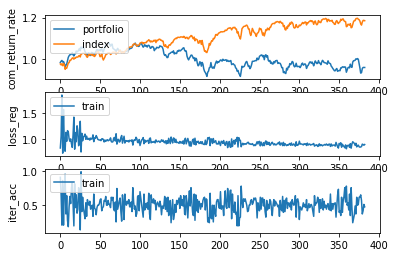

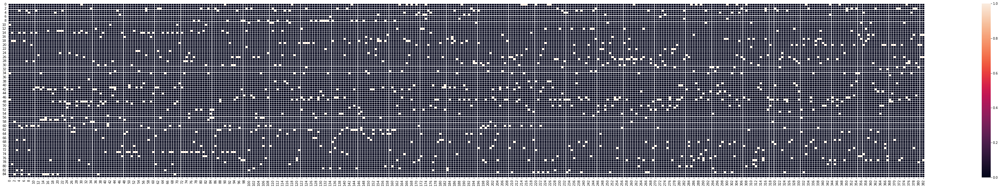

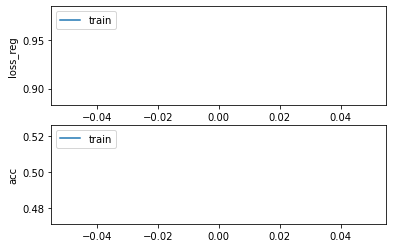

Epochs :  0 Iterations :  383 Loss :  0.9341077627152127 ACC :  0.4989402693727932 MCC :  nan Precision :  0.5082726419317309
mode : validation


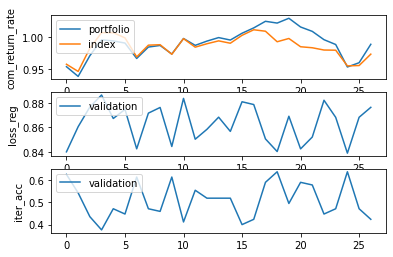

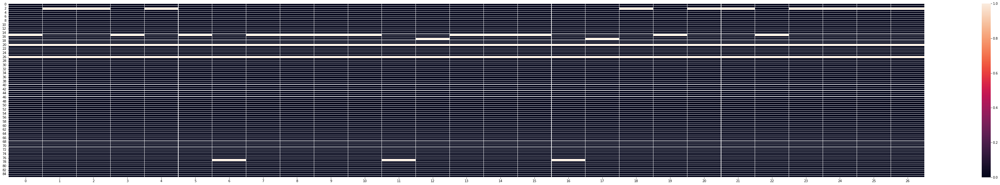

Epochs :  0 Iterations :  27 Loss :  0.8631064847663596 ACC :  0.5080610160474424 MCC :  nan Precision :  0.49200242916467013


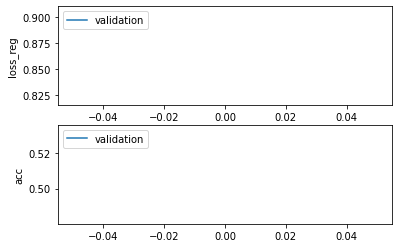

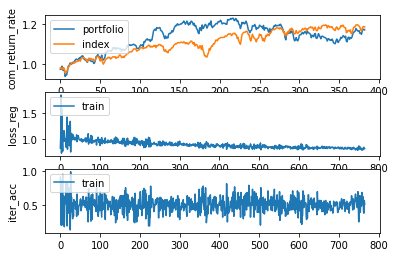

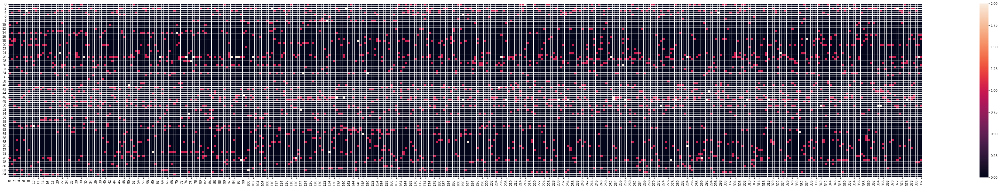

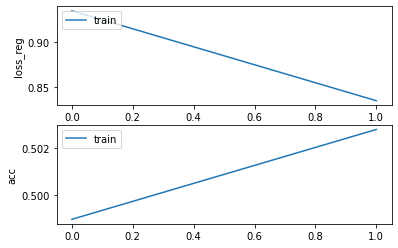

Epochs :  1 Iterations :  766 Loss :  0.8353440847160299 ACC :  0.5028106429013509 MCC :  0.010975643807314531 Precision :  0.5156710910399301
mode : validation


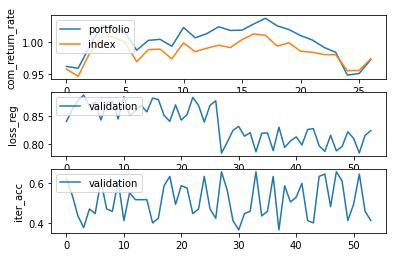

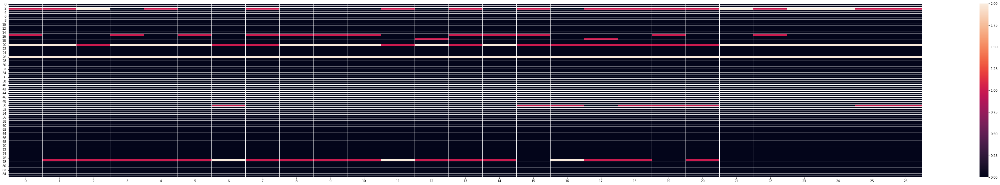

Epochs :  1 Iterations :  27 Loss :  0.8086698651313782 ACC :  0.516775612477903 MCC :  nan Precision :  0.508005487146201


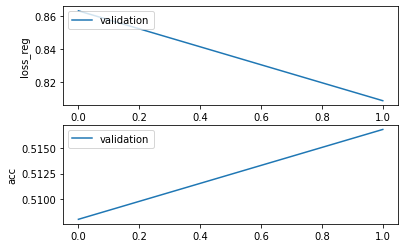

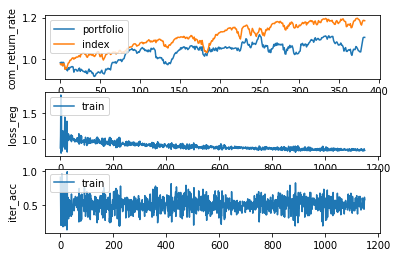

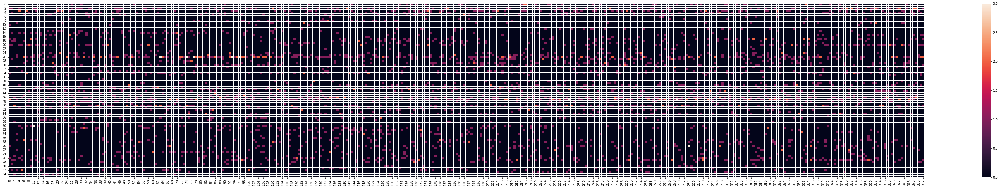

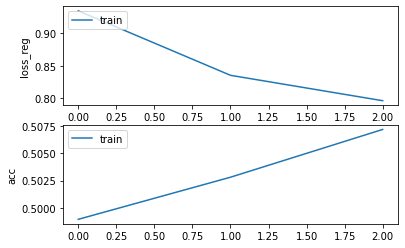

Epochs :  2 Iterations :  1149 Loss :  0.7964292137492107 ACC :  0.5072032101160553 MCC :  0.015423054388644023 Precision :  0.5182868154991817
mode : validation


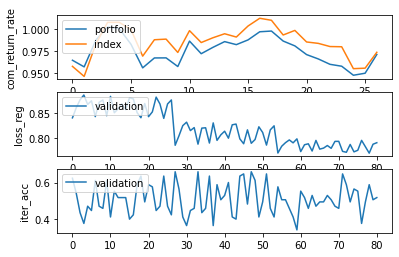

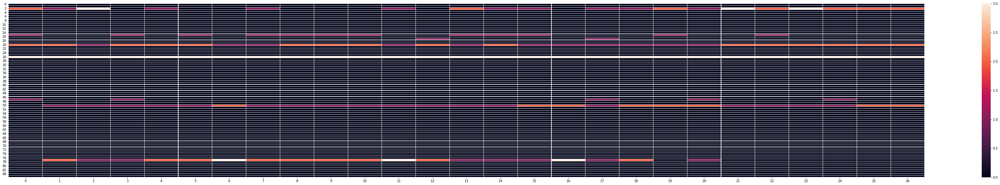

Epochs :  2 Iterations :  27 Loss :  0.7828956113921272 ACC :  0.5041394498613145 MCC :  nan Precision :  0.4912396263745096


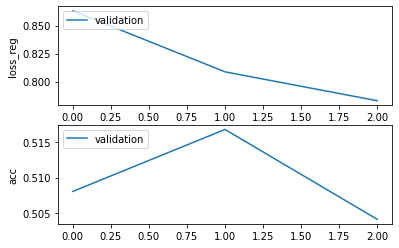

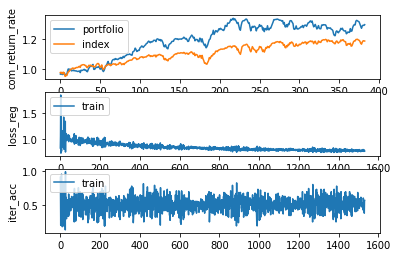

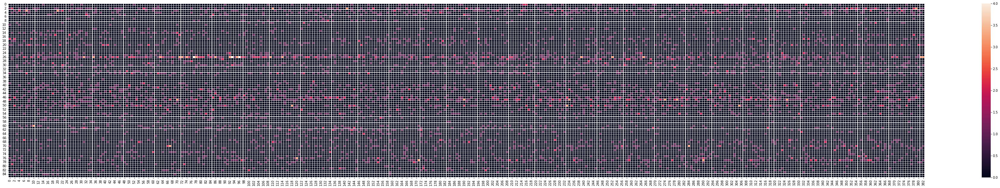

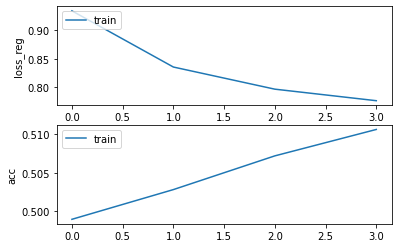

Epochs :  3 Iterations :  1532 Loss :  0.7761424174507978 ACC :  0.510643541657271 MCC :  0.021017739117053135 Precision :  0.5184508952805796
mode : validation


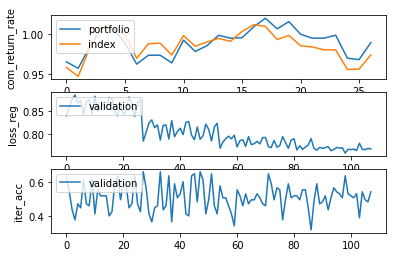

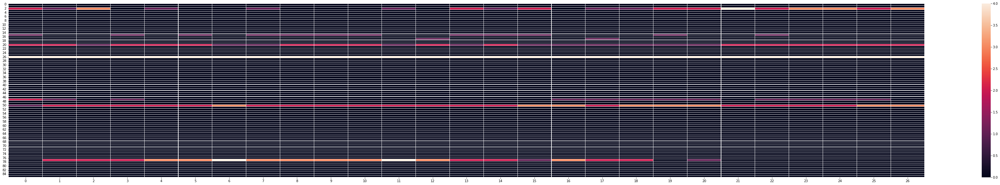

Epochs :  3 Iterations :  27 Loss :  0.7692876127031114 ACC :  0.5063181011765091 MCC :  nan Precision :  0.4970139905258461


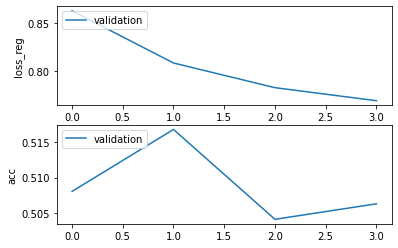

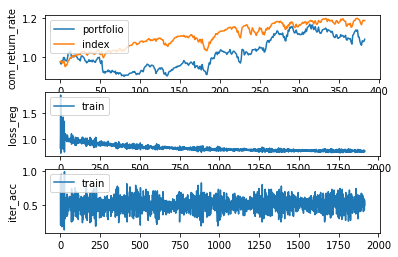

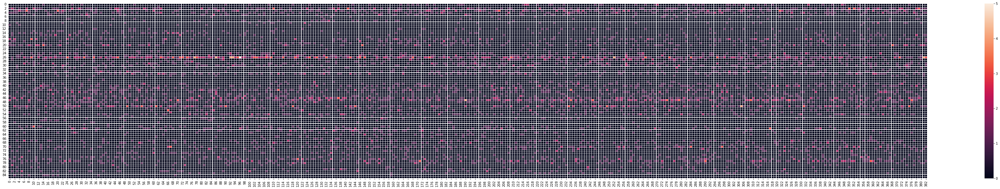

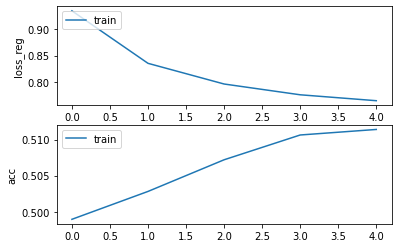

Epochs :  4 Iterations :  1915 Loss :  0.7650104792248799 ACC :  0.5114114736218988 MCC :  0.02619618083780155 Precision :  0.5202977494446089
mode : validation


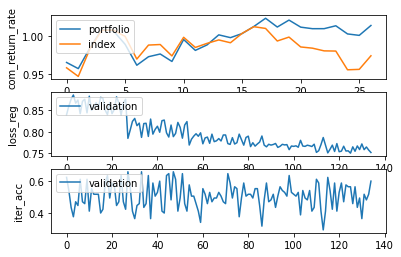

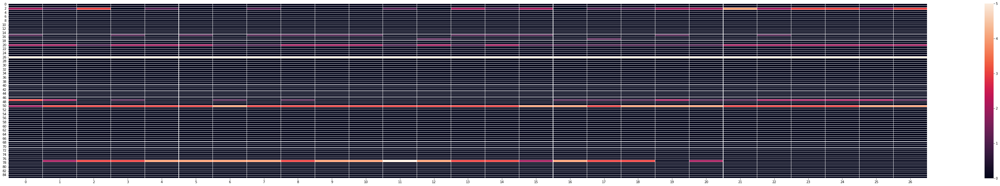

Epochs :  4 Iterations :  27 Loss :  0.7613857763784903 ACC :  0.4993464207207715 MCC :  nan Precision :  0.48929124849813954


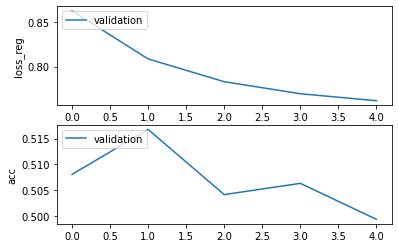

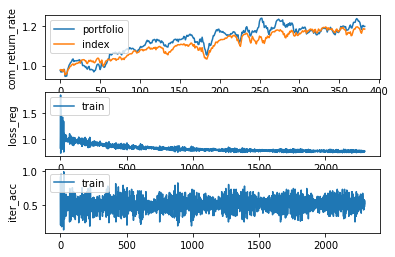

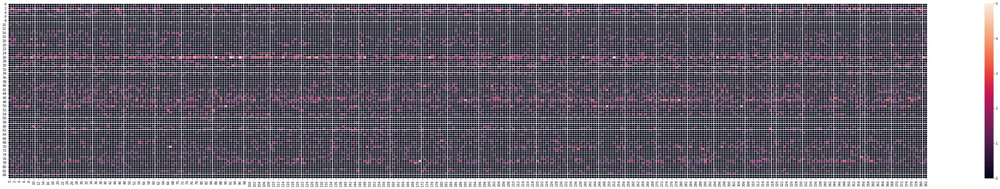

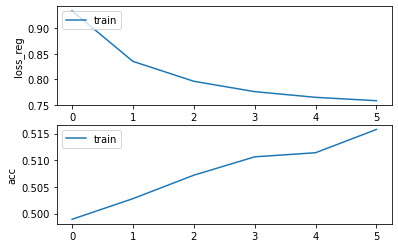

Epochs :  5 Iterations :  2298 Loss :  0.7584203943882536 ACC :  0.5157733226958516 MCC :  0.032202933922102404 Precision :  0.5226668712948072
mode : validation


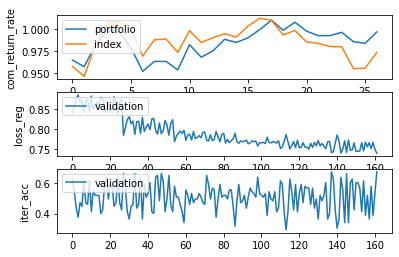

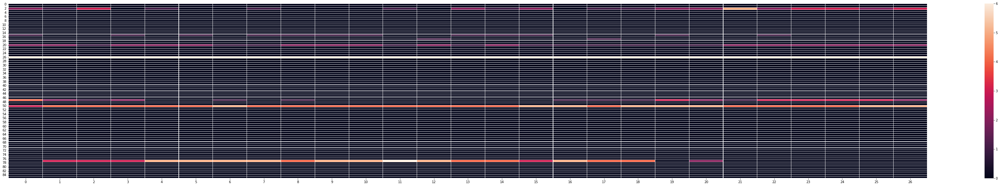

Epochs :  5 Iterations :  27 Loss :  0.7565826530809756 ACC :  0.5019608007536994 MCC :  nan Precision :  0.49521651960633417


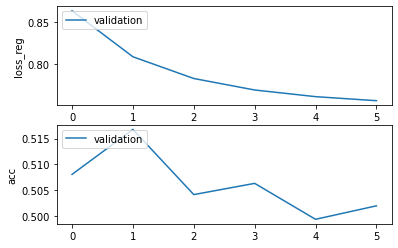

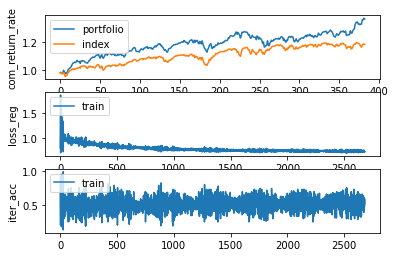

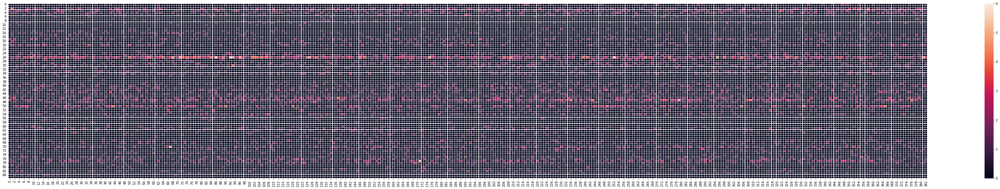

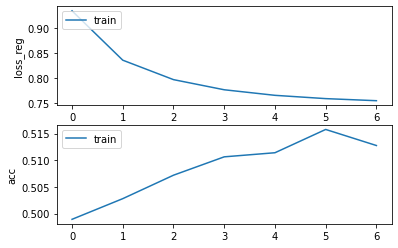

Epochs :  6 Iterations :  2681 Loss :  0.7542469711590062 ACC :  0.5127630325583814 MCC :  0.028579781507932174 Precision :  0.5210333589279621
mode : validation


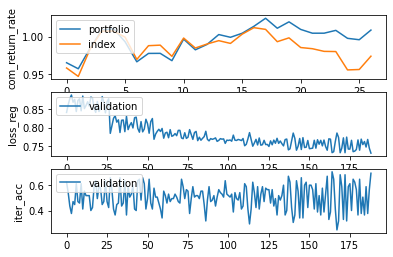

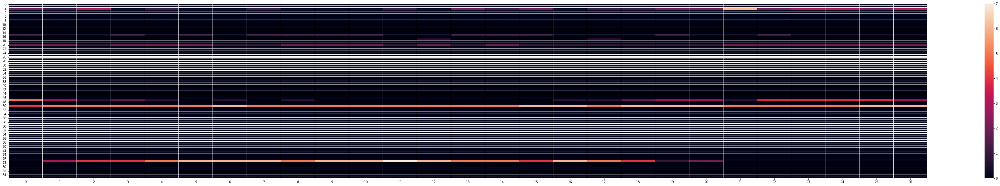

Epochs :  6 Iterations :  27 Loss :  0.7536971833970811 ACC :  0.5023965300233276 MCC :  nan Precision :  0.49497568179611806


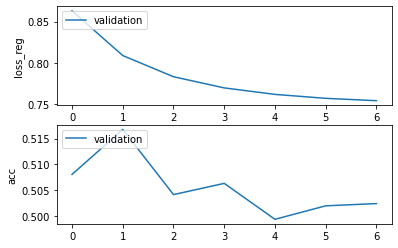

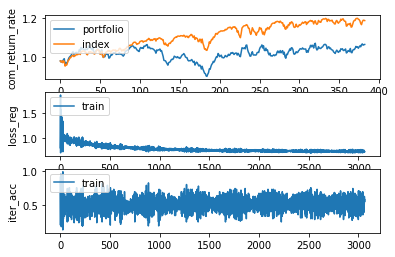

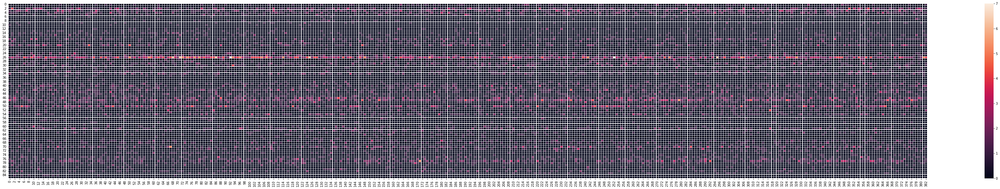

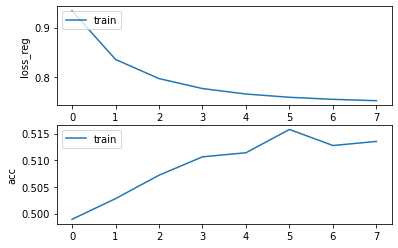

Epochs :  7 Iterations :  3064 Loss :  0.7514578041768883 ACC :  0.5135309636281613 MCC :  0.026369259985438584 Precision :  0.5203288329361546
mode : validation


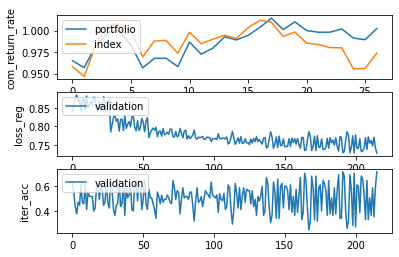

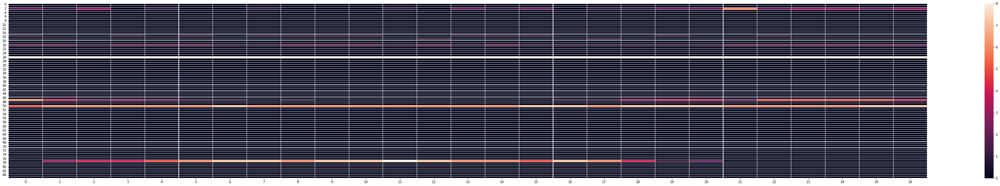

Epochs :  7 Iterations :  27 Loss :  0.7518169460473237 ACC :  0.49978215164608425 MCC :  nan Precision :  0.49381793276579294


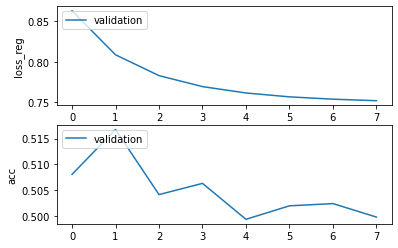

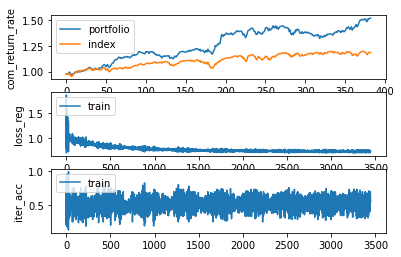

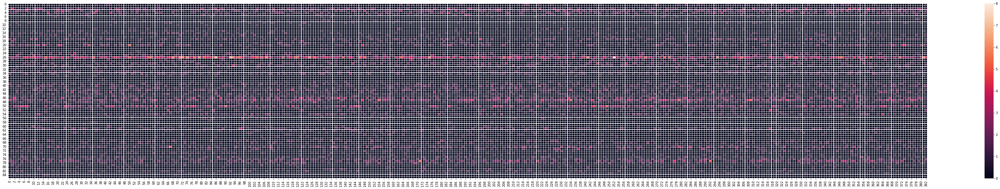

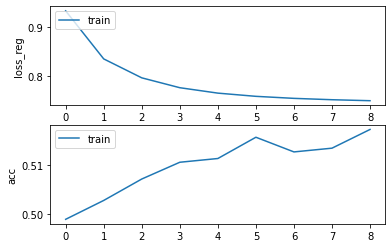

Epochs :  8 Iterations :  3447 Loss :  0.7494372253940871 ACC :  0.5173706200664411 MCC :  0.03601389279037072 Precision :  0.5232056403440222
mode : validation


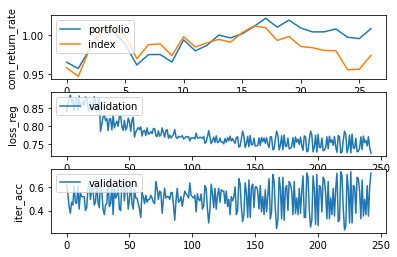

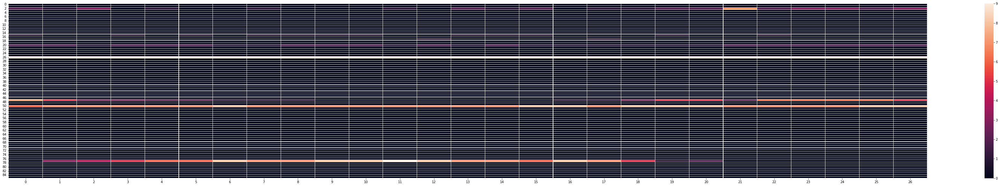

Epochs :  8 Iterations :  27 Loss :  0.750482009516822 ACC :  0.5023965289195379 MCC :  nan Precision :  0.4943673398207735


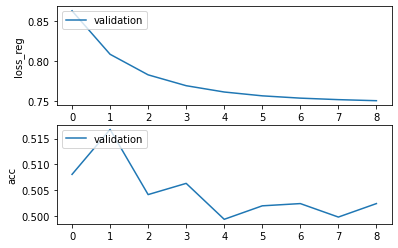

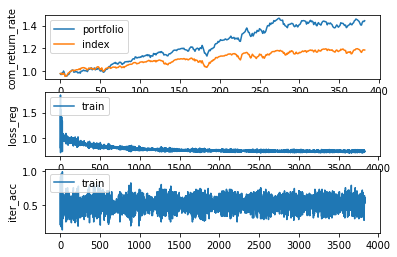

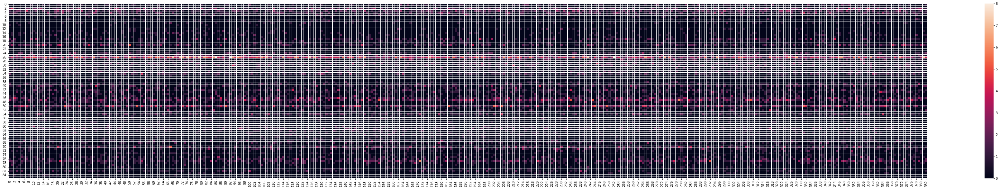

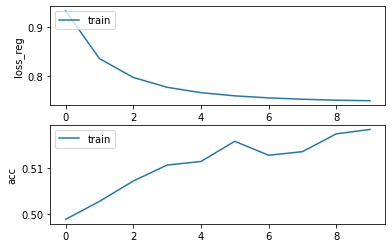

Epochs :  9 Iterations :  3830 Loss :  0.7484013147204726 ACC :  0.5183228545338304 MCC :  0.03689378262260399 Precision :  0.5235910424451993
mode : validation


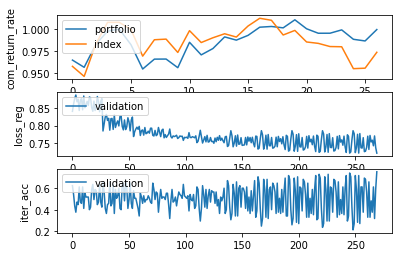

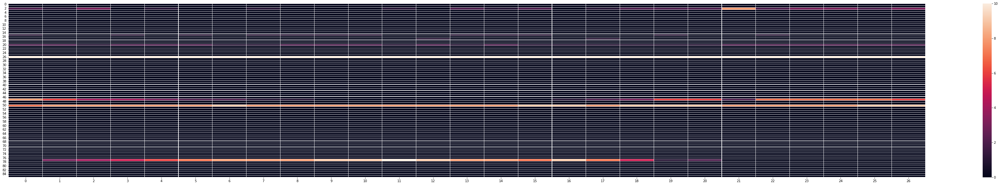

Epochs :  9 Iterations :  27 Loss :  0.749754912323422 ACC :  0.5019607990980148 MCC :  nan Precision :  0.4953018195099301


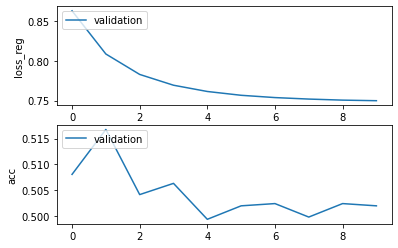

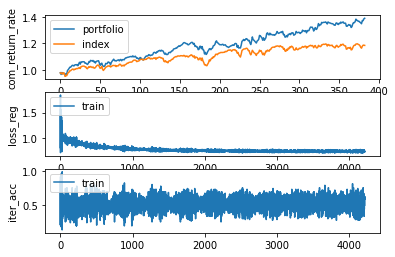

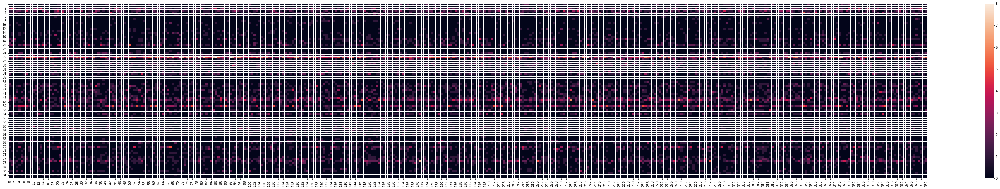

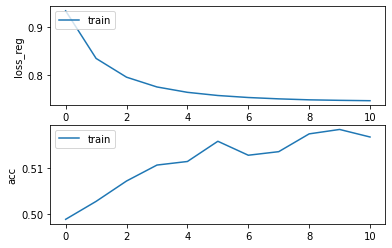

Epochs :  10 Iterations :  4213 Loss :  0.7476268245719432 ACC :  0.5166948399562438 MCC :  0.026311287240158066 Precision :  0.5203932978883969
mode : validation


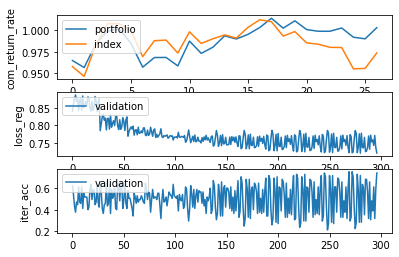

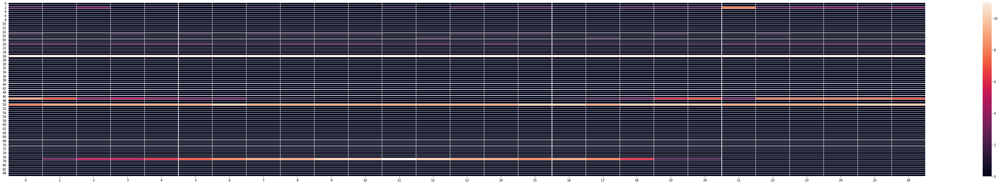

Epochs :  10 Iterations :  27 Loss :  0.7491761026559053 ACC :  0.5010893394549688 MCC :  nan Precision :  0.4938285370115881


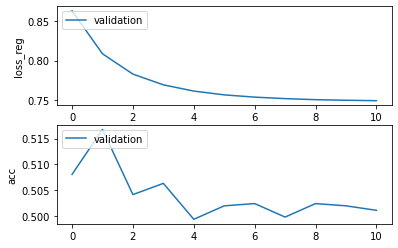

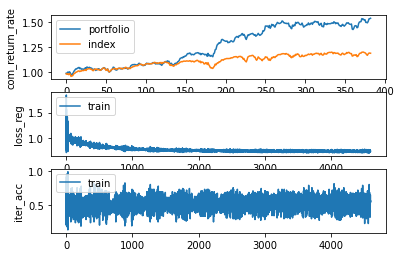

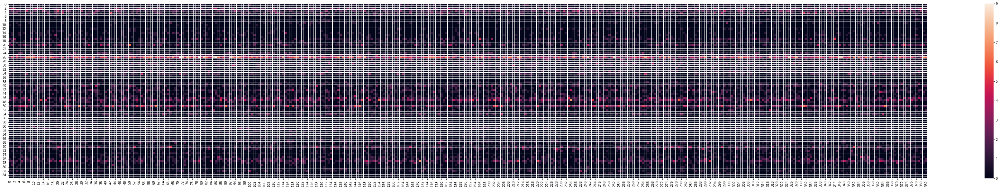

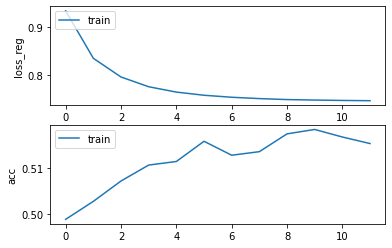

Epochs :  11 Iterations :  4596 Loss :  0.7470778570785224 ACC :  0.5152818463334216 MCC :  0.03272342807464375 Precision :  0.5218124341599001
mode : validation


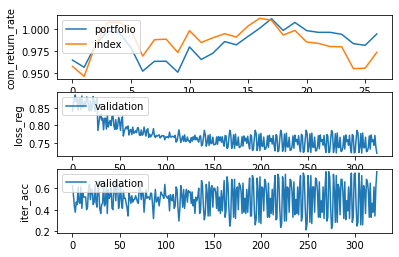

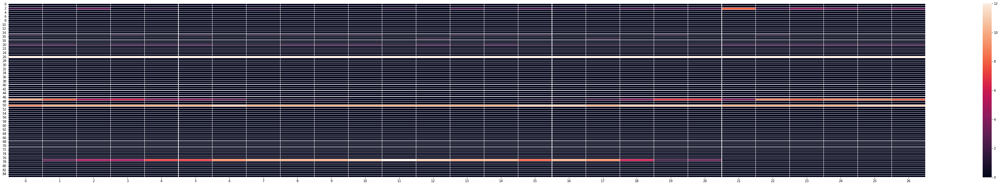

Epochs :  11 Iterations :  27 Loss :  0.7489232531300297 ACC :  0.5019607990980148 MCC :  nan Precision :  0.49409630963647805


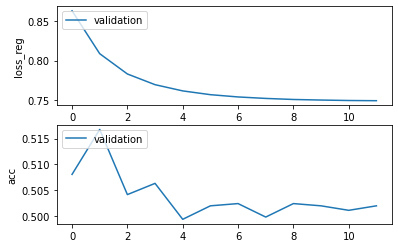

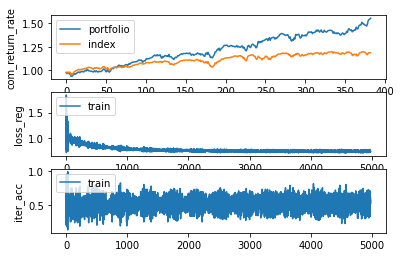

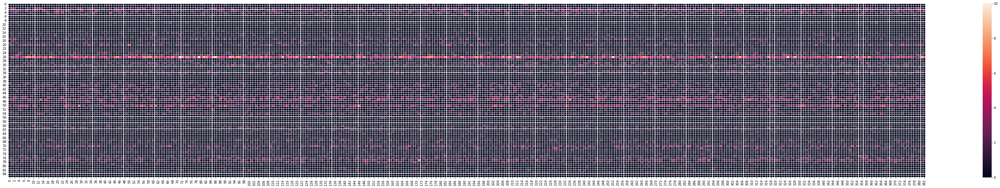

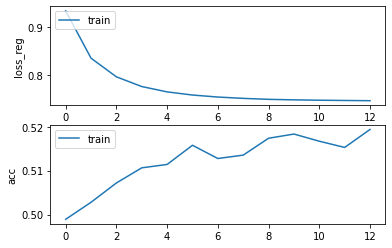

Epochs :  12 Iterations :  4979 Loss :  0.7465999199578407 ACC :  0.5193672408167438 MCC :  0.039751047428087 Precision :  0.5244840595131988
mode : validation


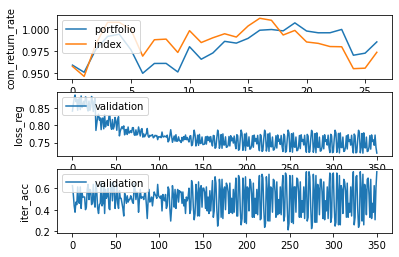

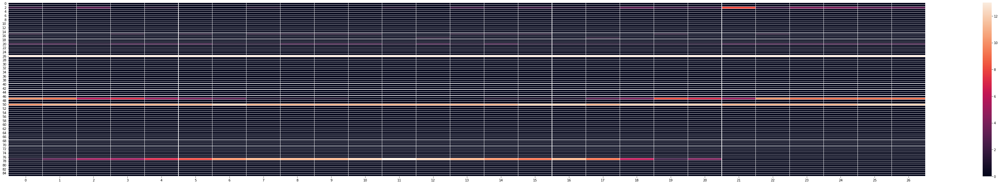

Epochs :  12 Iterations :  27 Loss :  0.7486334023652254 ACC :  0.5002178798119227 MCC :  nan Precision :  0.4941925297456759


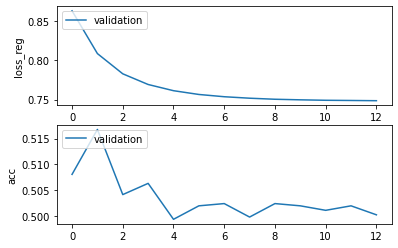

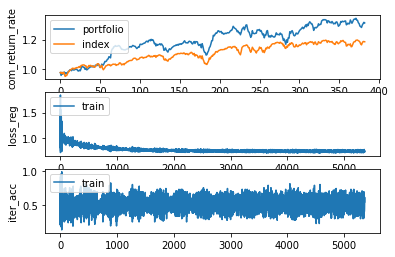

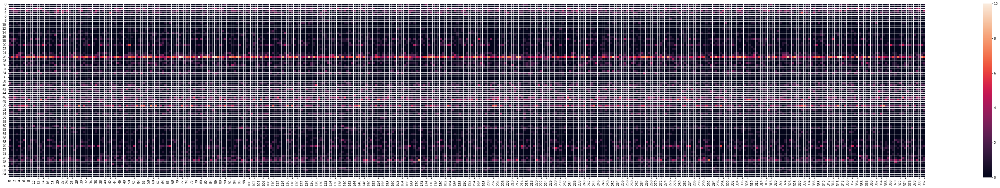

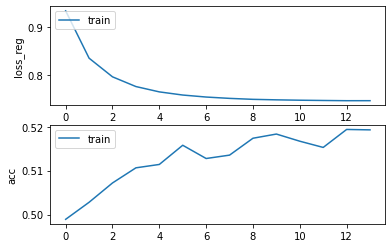

Epochs :  13 Iterations :  5362 Loss :  0.746640614834529 ACC :  0.5192750886899684 MCC :  0.03623777242345789 Precision :  0.5228770614720822
mode : validation


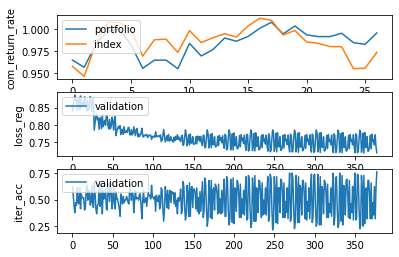

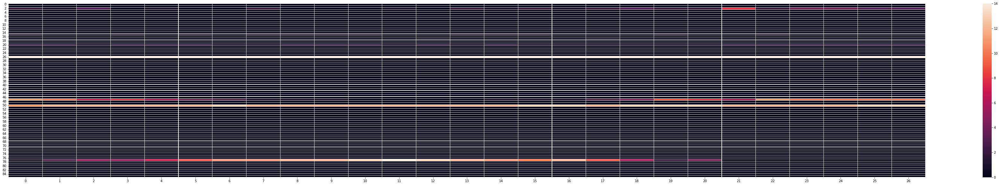

Epochs :  13 Iterations :  27 Loss :  0.7485946505158035 ACC :  0.4989106897954588 MCC :  nan Precision :  0.49205536733346955


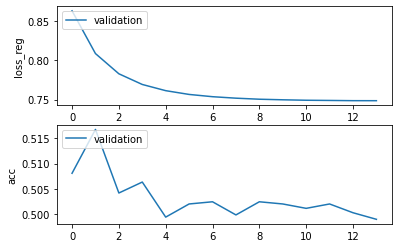

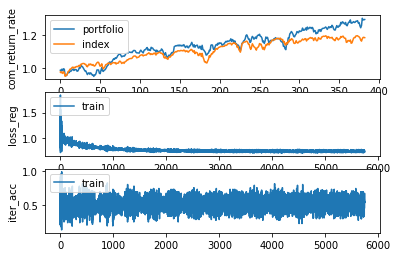

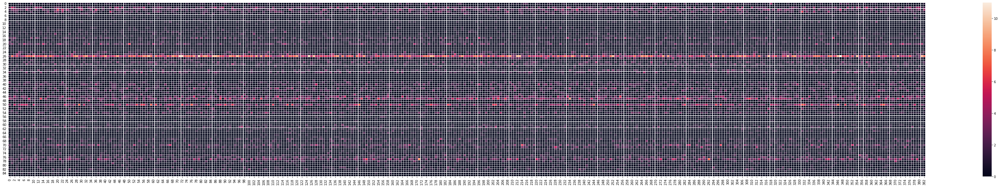

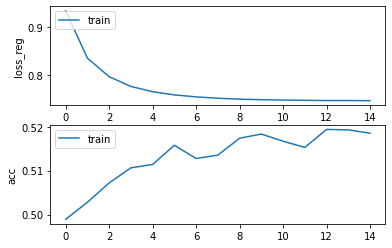

Epochs :  14 Iterations :  5745 Loss :  0.7462637092986244 ACC :  0.5185071581648785 MCC :  0.032949649119705895 Precision :  0.5231664610525725
mode : validation


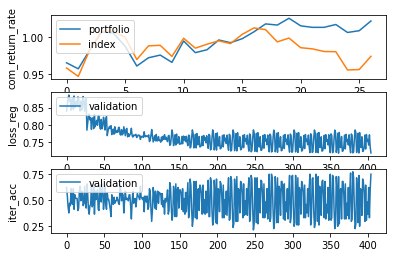

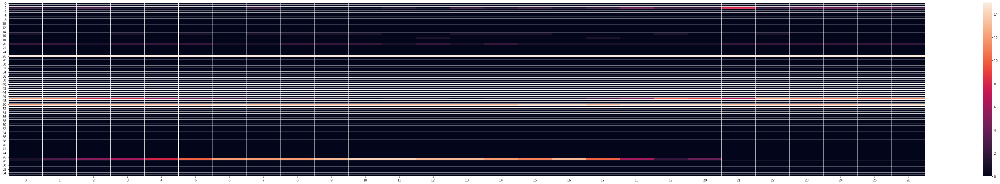

Epochs :  14 Iterations :  27 Loss :  0.7483783055234838 ACC :  0.5002178792600278 MCC :  nan Precision :  0.4932886923628825


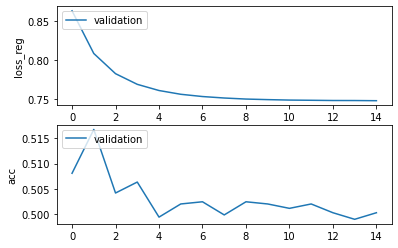

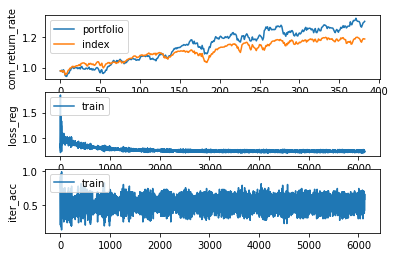

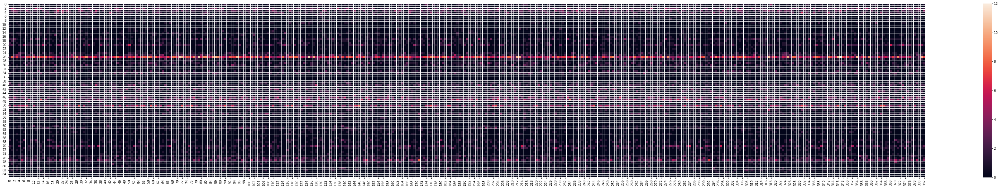

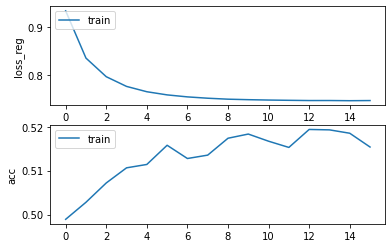

Epochs :  15 Iterations :  6128 Loss :  0.7465836228340786 ACC :  0.5153739983045712 MCC :  0.03079876425240174 Precision :  0.5212941250031906
mode : validation


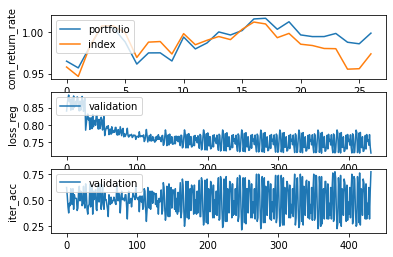

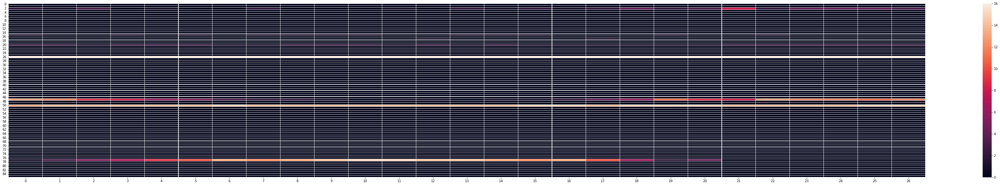

Epochs :  15 Iterations :  27 Loss :  0.7483578103559988 ACC :  0.5002178798119227 MCC :  nan Precision :  0.4925660125359341


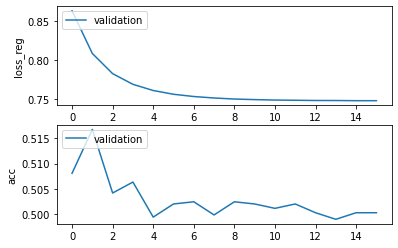

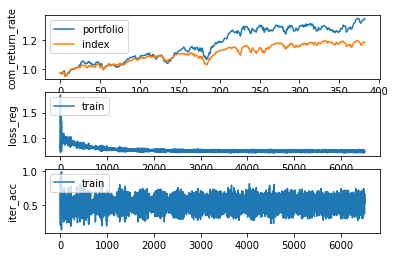

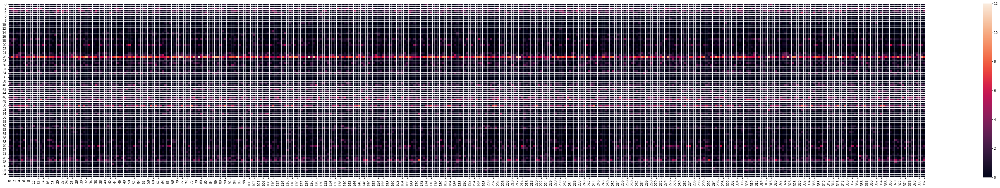

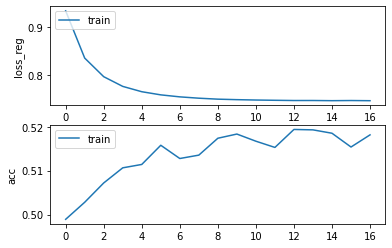

Epochs :  16 Iterations :  6511 Loss :  0.7462144307305857 ACC :  0.5181385506693439 MCC :  0.035355940156898344 Precision :  0.5233978784543416
mode : validation


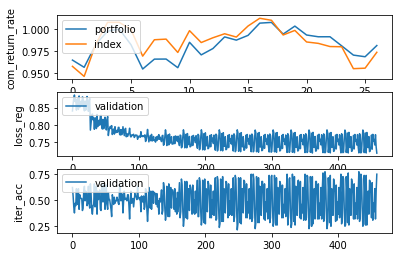

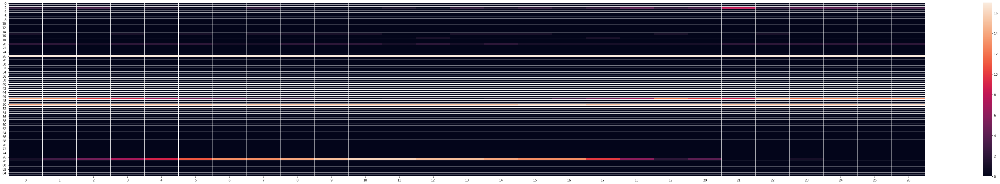

Epochs :  16 Iterations :  27 Loss :  0.74829410844379 ACC :  0.5006536096334457 MCC :  nan Precision :  0.49190222540939293


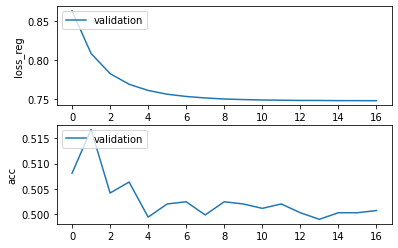

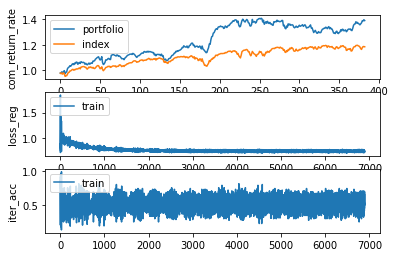

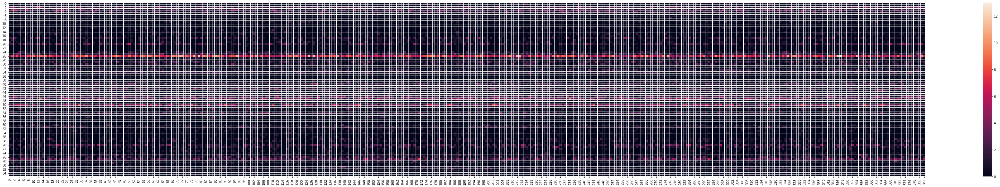

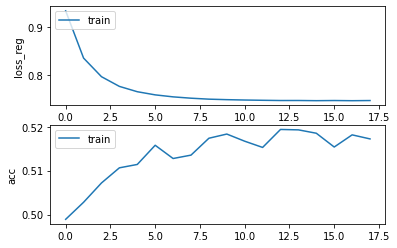

Epochs :  17 Iterations :  6894 Loss :  0.7465620114037635 ACC :  0.5172170337202032 MCC :  0.032528530881684226 Precision :  0.5226713591851002
mode : validation


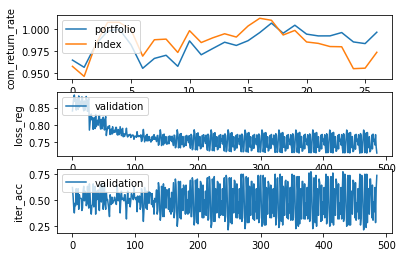

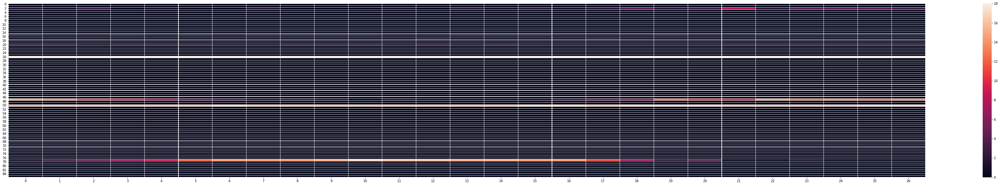

Epochs :  17 Iterations :  27 Loss :  0.7482449390270092 ACC :  0.500653608529656 MCC :  nan Precision :  0.49445071788849654


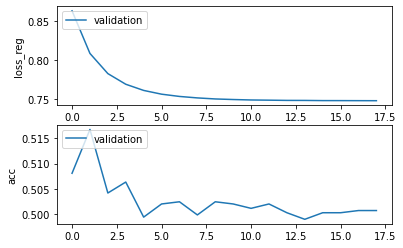

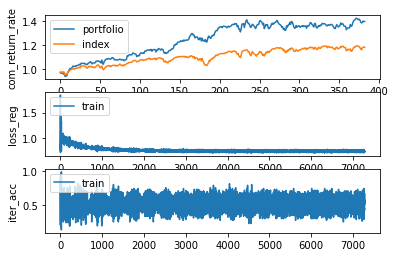

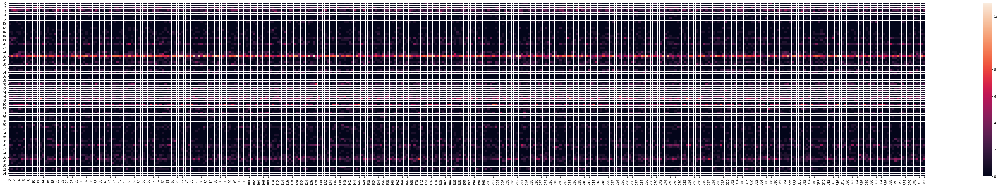

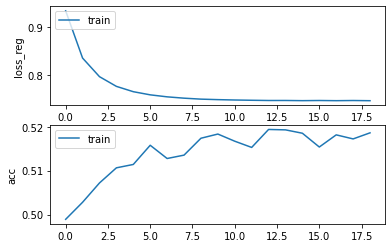

Epochs :  18 Iterations :  7277 Loss :  0.7461635465721549 ACC :  0.5185993106807181 MCC :  0.03585328532892885 Precision :  0.5236486938512123
mode : validation


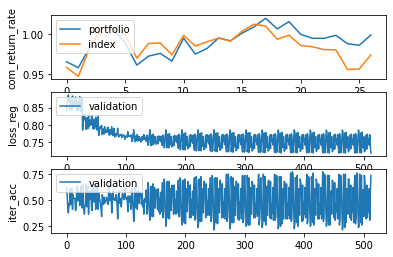

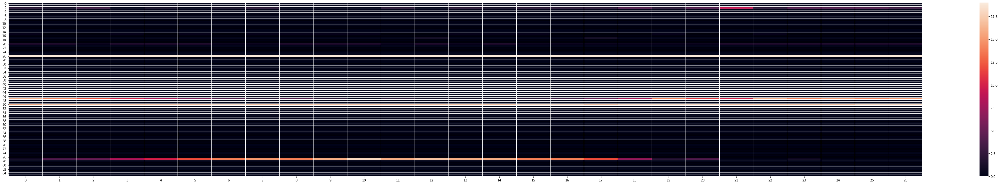

Epochs :  18 Iterations :  27 Loss :  0.7482605223302488 ACC :  0.4997821494385048 MCC :  nan Precision :  0.4923085538601434


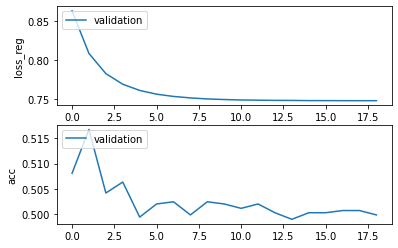

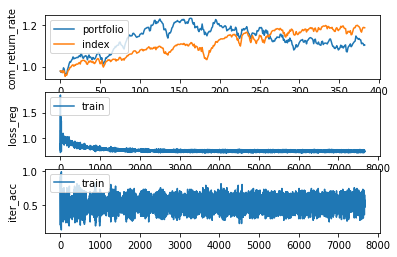

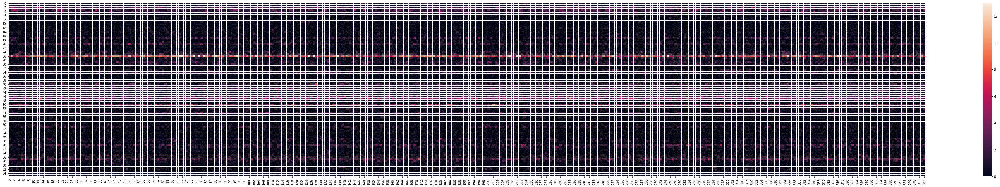

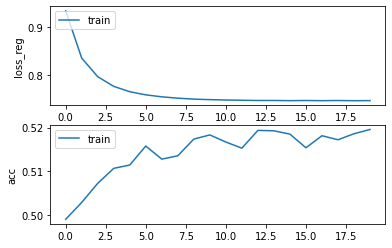

Epochs :  19 Iterations :  7660 Loss :  0.7463945936285173 ACC :  0.5195822616936955 MCC :  0.0326237661112647 Precision :  0.522161946464184
mode : validation


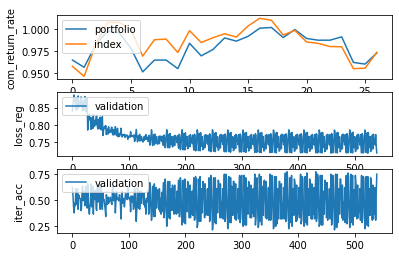

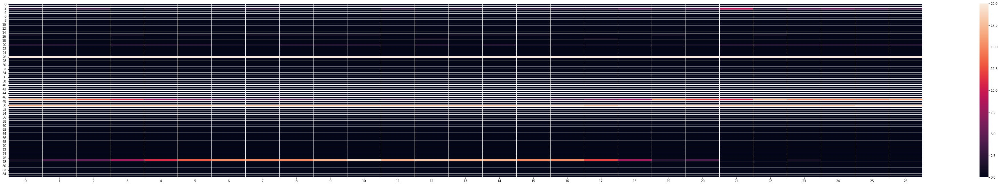

Epochs :  19 Iterations :  27 Loss :  0.7482924196455214 ACC :  0.4984749599739357 MCC :  nan Precision :  0.49278763709244905


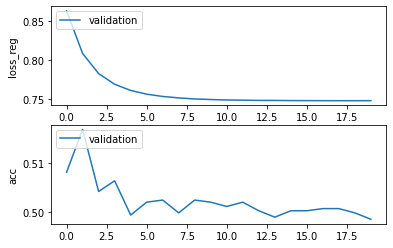

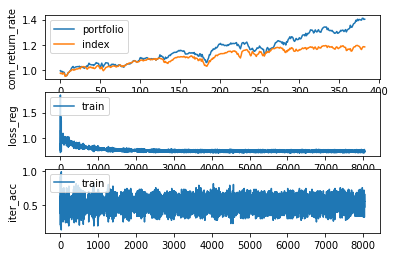

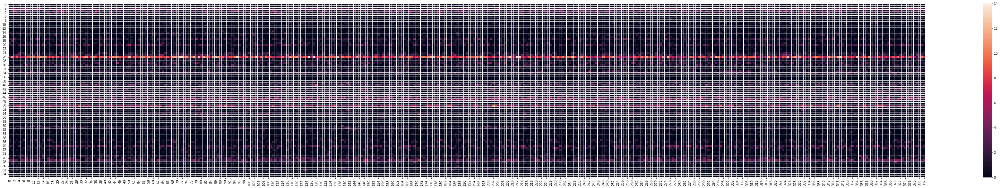

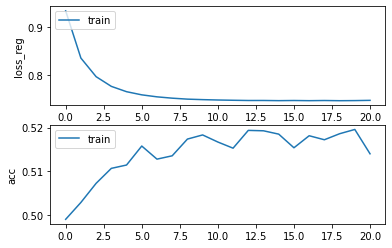

Epochs :  20 Iterations :  8043 Loss :  0.7468910682606013 ACC :  0.5139917220054656 MCC :  0.03206125648638146 Precision :  0.521254571786943
mode : validation


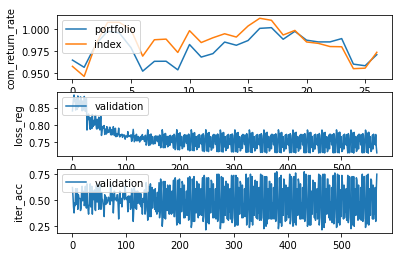

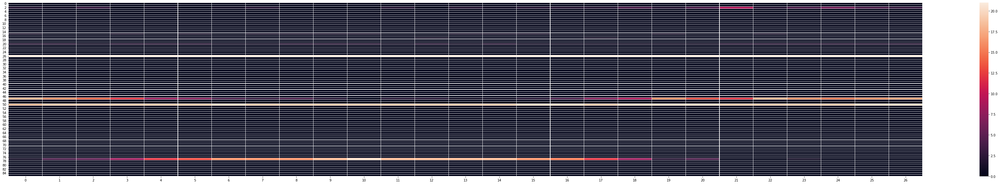

Epochs :  20 Iterations :  27 Loss :  0.7482723593711853 ACC :  0.5002178798119227 MCC :  nan Precision :  0.49327391399829473


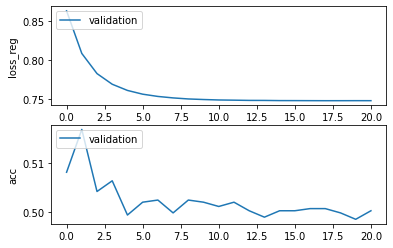

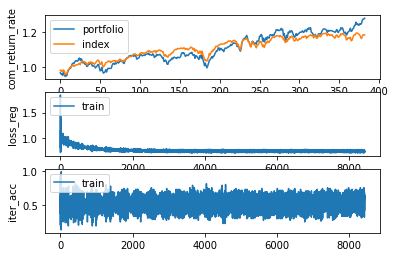

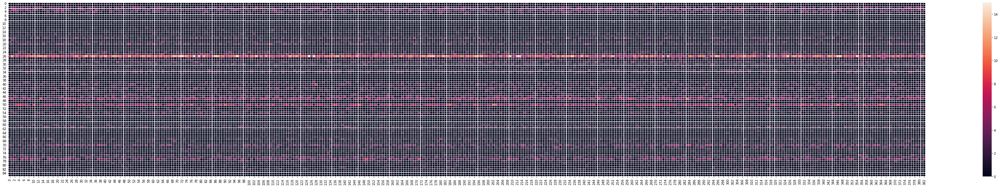

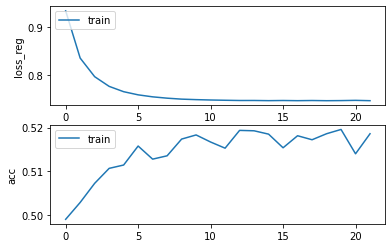

Epochs :  21 Iterations :  8426 Loss :  0.7461992681182085 ACC :  0.5185993097469639 MCC :  0.03518114250710151 Precision :  0.5227755708449736
mode : validation


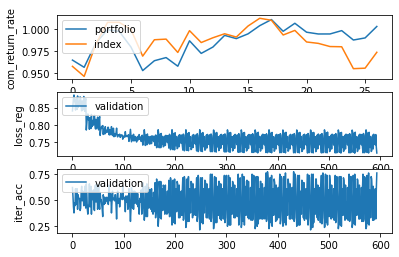

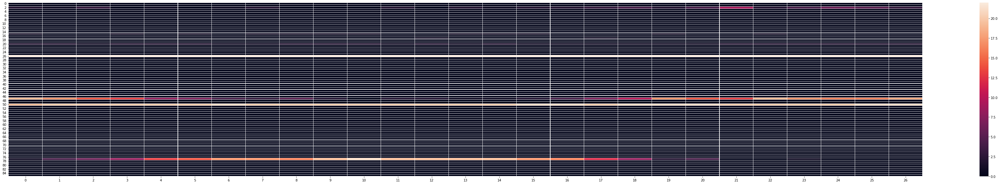

Epochs :  21 Iterations :  27 Loss :  0.7482392810009144 ACC :  0.4993464196169818 MCC :  nan Precision :  0.4915165352048697


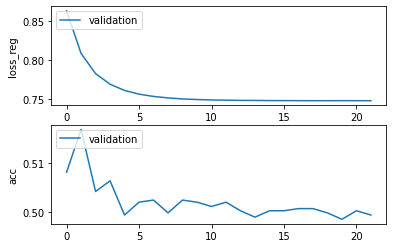

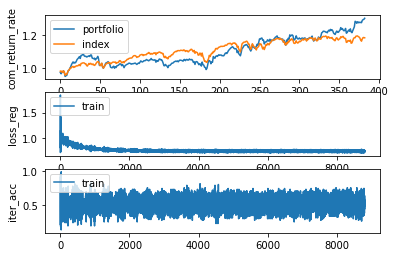

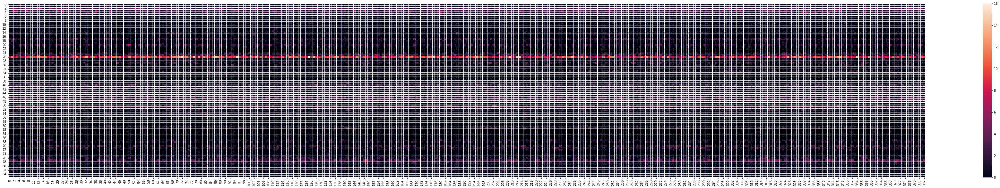

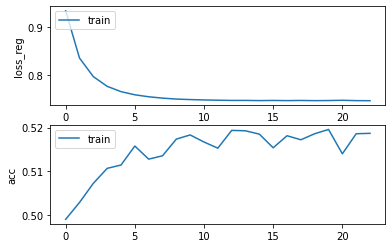

Epochs :  22 Iterations :  8809 Loss :  0.7460366881236083 ACC :  0.5186914614068622 MCC :  0.03761721439945315 Precision :  0.5235472040800451
mode : validation


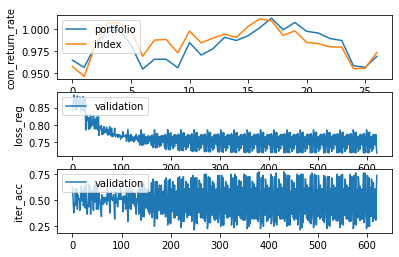

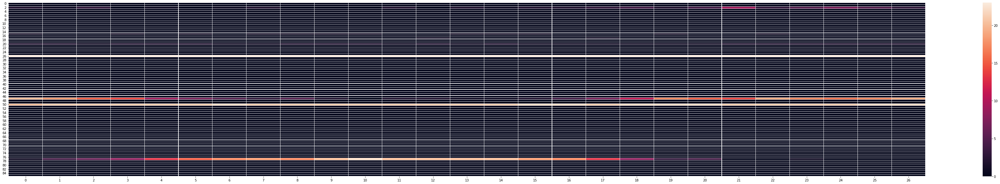

Epochs :  22 Iterations :  27 Loss :  0.7482341020195572 ACC :  0.501525068172702 MCC :  nan Precision :  0.49546772000138406


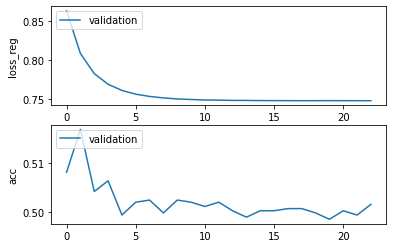

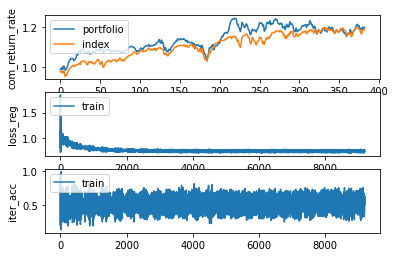

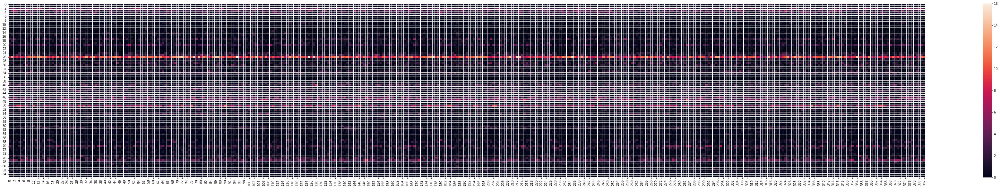

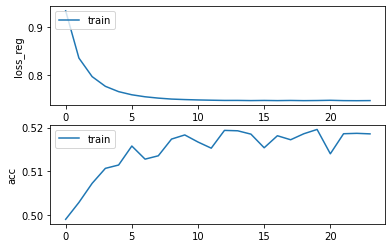

Epochs :  23 Iterations :  9192 Loss :  0.7462727495957915 ACC :  0.5185685928123116 MCC :  0.03510817488781286 Precision :  0.5230821268803224
mode : validation


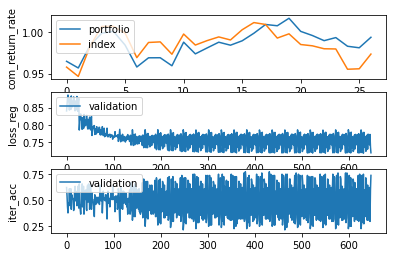

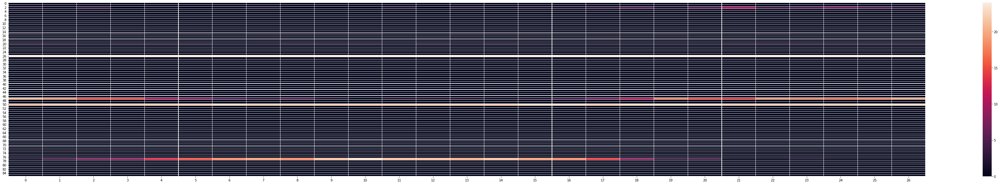

Epochs :  23 Iterations :  27 Loss :  0.7482130461268954 ACC :  0.5002178798119227 MCC :  nan Precision :  0.49226977993492727


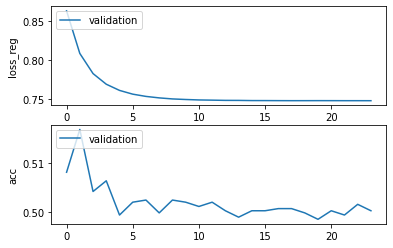

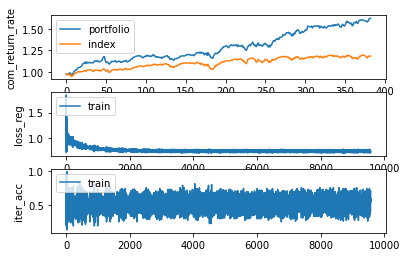

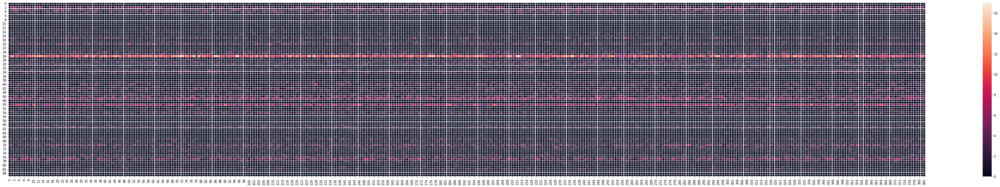

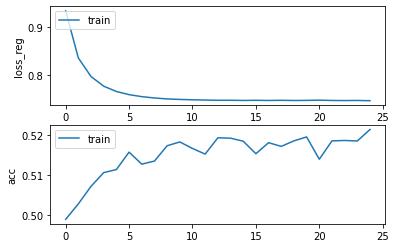

Epochs :  24 Iterations :  9575 Loss :  0.7457312522918064 ACC :  0.5214560143941376 MCC :  0.039022031692452434 Precision :  0.5249735495518144
mode : validation


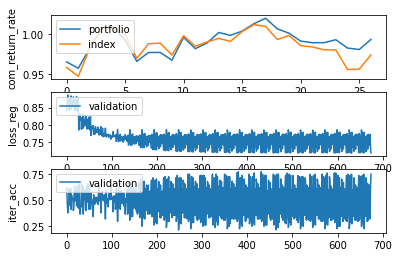

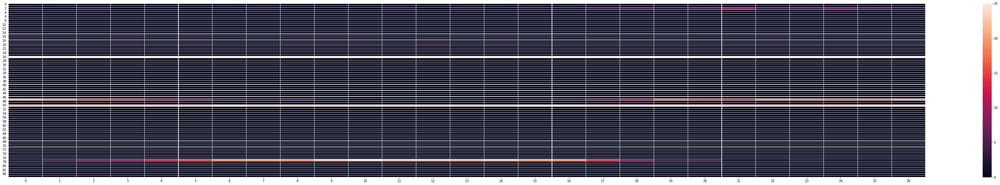

Epochs :  24 Iterations :  27 Loss :  0.7481869481228016 ACC :  0.5054466371183042 MCC :  nan Precision :  0.4960112375793634


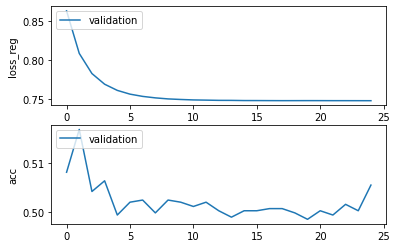

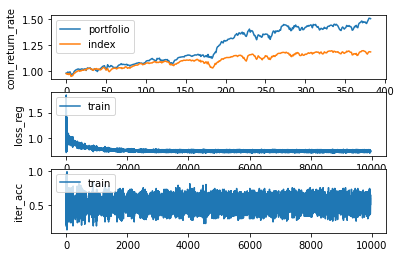

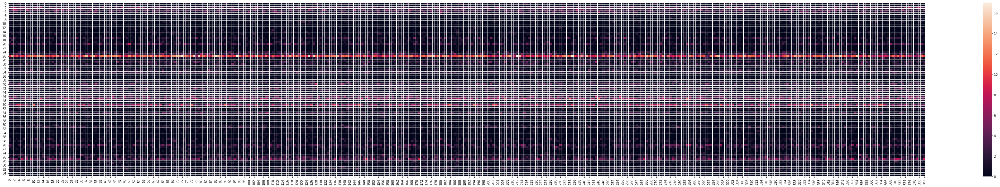

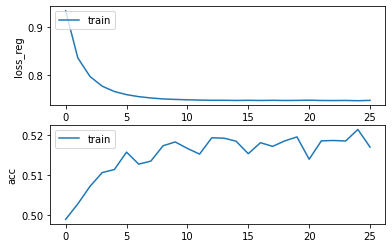

Epochs :  25 Iterations :  9958 Loss :  0.7463885536393049 ACC :  0.5170327298946231 MCC :  0.036090890957041356 Precision :  0.5233199968253197
mode : validation


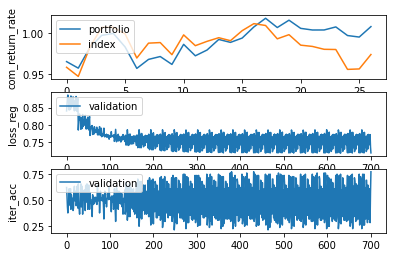

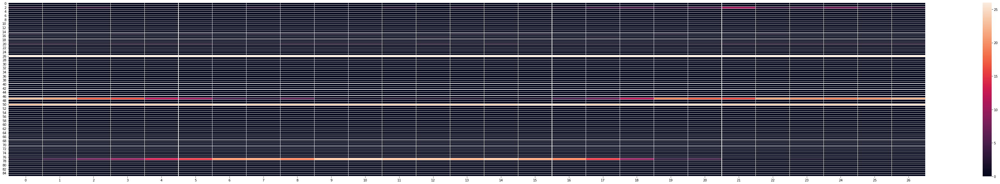

Epochs :  25 Iterations :  27 Loss :  0.7481941315862868 ACC :  0.49368193248907727 MCC :  nan Precision :  0.49158344845528956


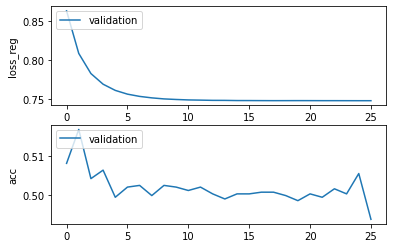

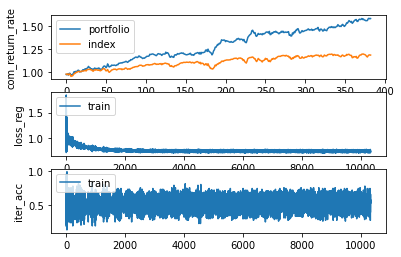

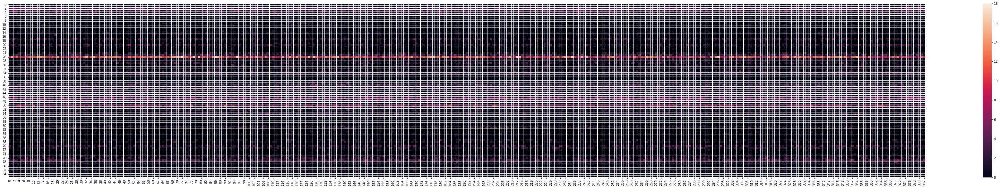

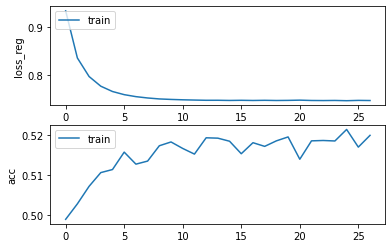

Epochs :  26 Iterations :  10341 Loss :  0.7461145347465734 ACC :  0.5199815862016952 MCC :  0.038372474690496816 Precision :  0.5243874522358879
mode : validation


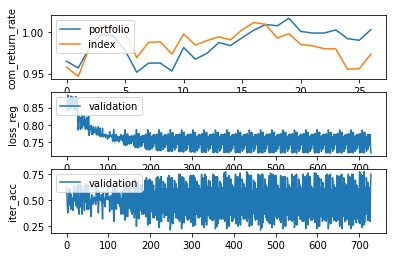

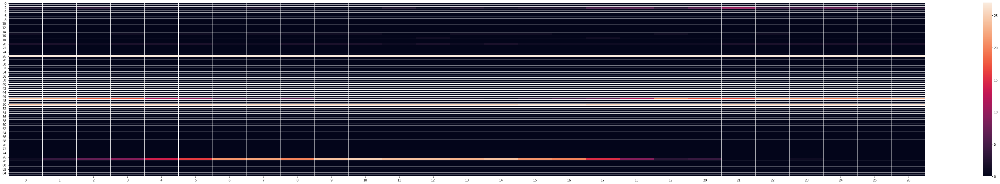

Epochs :  26 Iterations :  27 Loss :  0.7482029861874051 ACC :  0.5063180973132452 MCC :  nan Precision :  0.4953555052203161


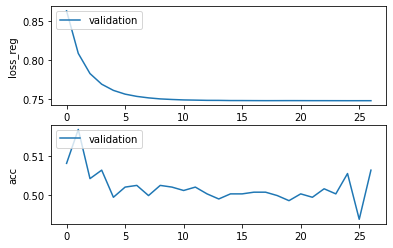

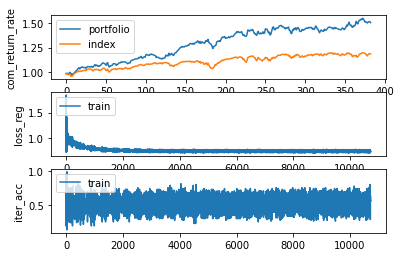

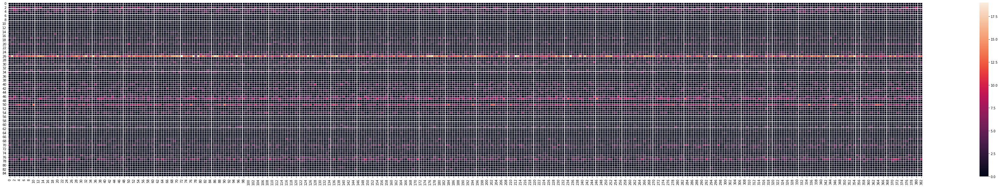

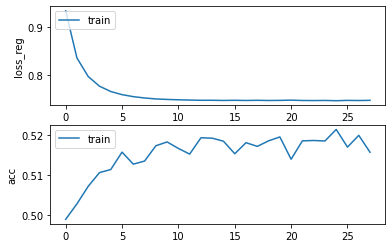

Epochs :  27 Iterations :  10724 Loss :  0.7464940420330037 ACC :  0.5157426054110414 MCC :  0.032403043649395245 Precision :  0.5224006443136121
mode : validation


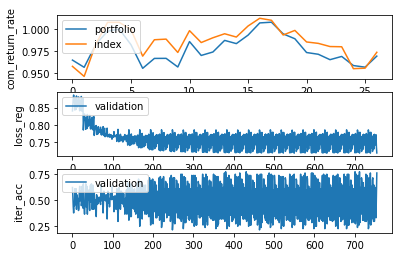

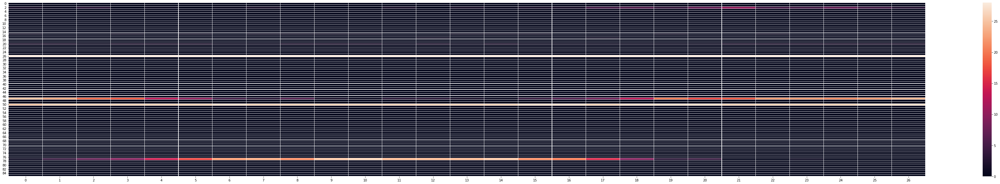

Epochs :  27 Iterations :  27 Loss :  0.7482267684406705 ACC :  0.5002178792600278 MCC :  nan Precision :  0.49395109092195827


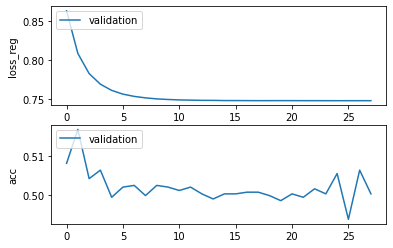

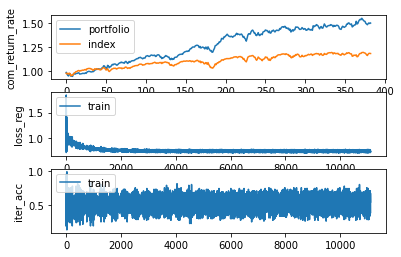

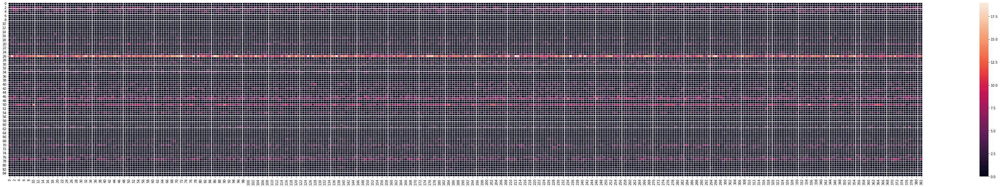

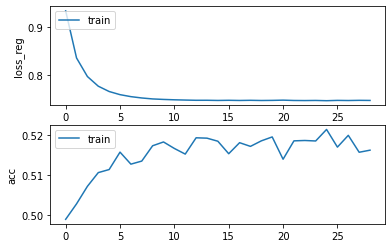

Epochs :  28 Iterations :  11107 Loss :  0.746286353305488 ACC :  0.5162647996029717 MCC :  0.031345247118989145 Precision :  0.522123396012436
mode : validation


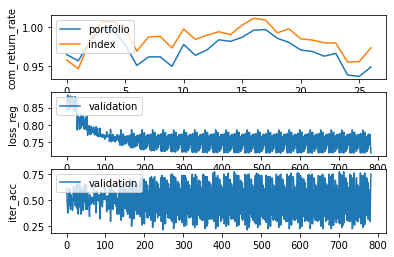

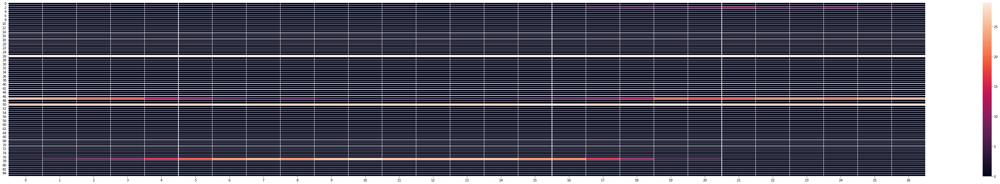

Epochs :  28 Iterations :  27 Loss :  0.7481800803431758 ACC :  0.5023965289195379 MCC :  nan Precision :  0.4954103991665222


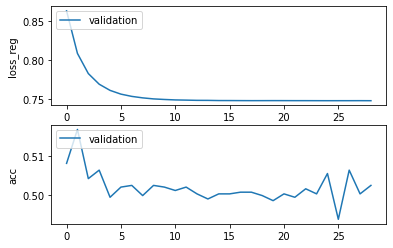

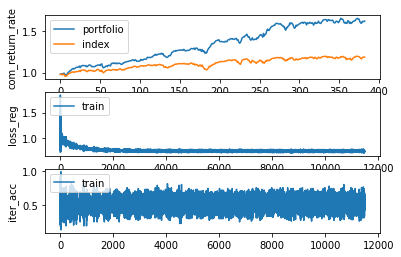

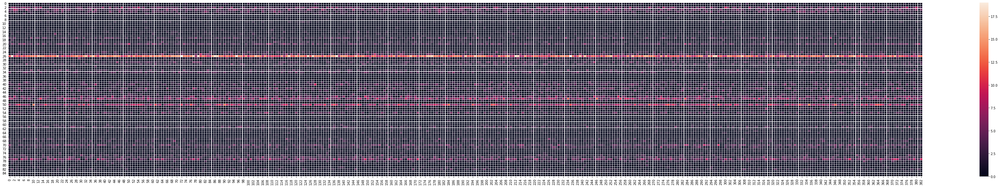

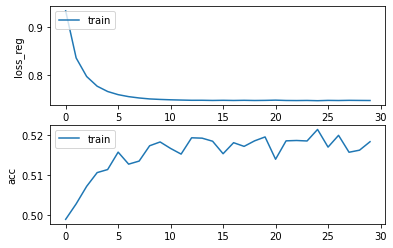

Epochs :  29 Iterations :  11490 Loss :  0.7461449201984754 ACC :  0.5183842887143865 MCC :  0.03464652395058866 Precision :  0.5228764121967803
mode : validation


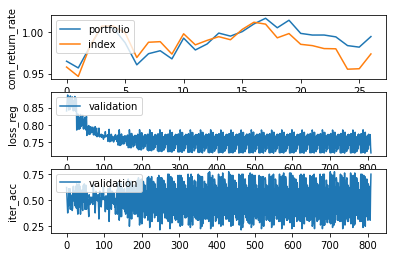

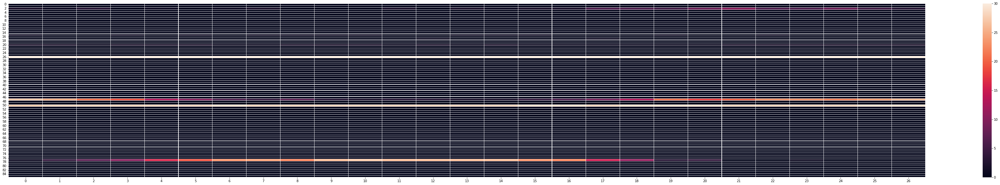

Epochs :  29 Iterations :  27 Loss :  0.7482323249181112 ACC :  0.4980392301524127 MCC :  nan Precision :  0.4928069042938727


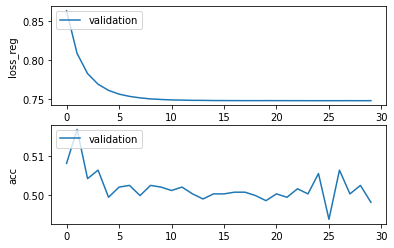

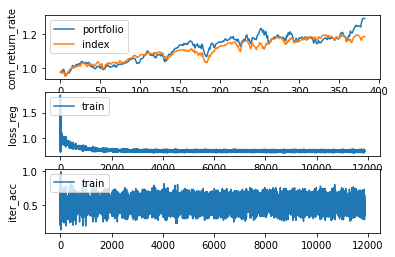

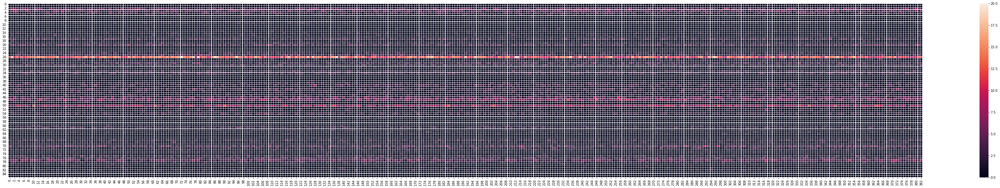

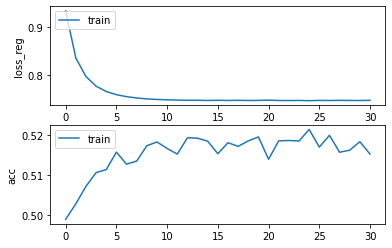

Epochs :  30 Iterations :  11873 Loss :  0.7465279192588348 ACC :  0.5152818474228015 MCC :  0.026029963064853674 Precision :  0.5205159226661018
mode : validation


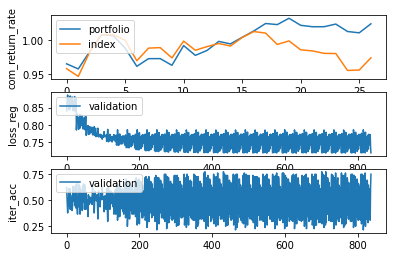

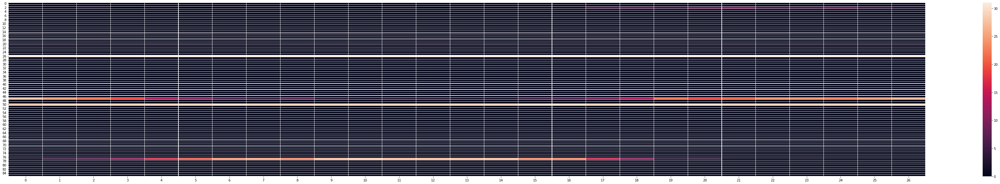

Epochs :  30 Iterations :  27 Loss :  0.7481988006167941 ACC :  0.5006536090815509 MCC :  nan Precision :  0.4936676145427757


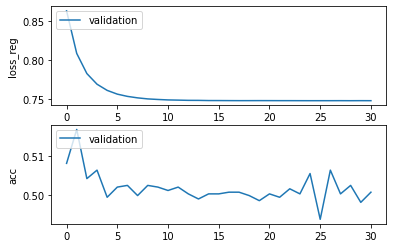

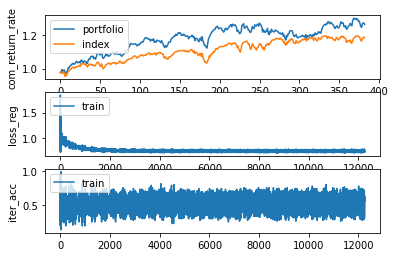

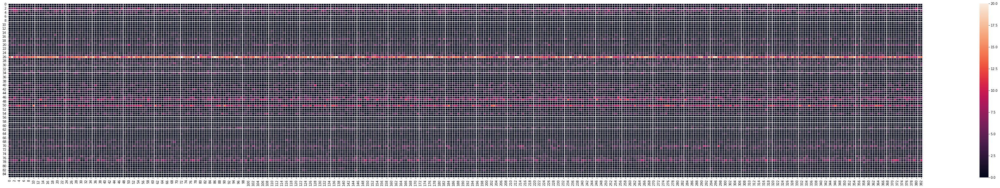

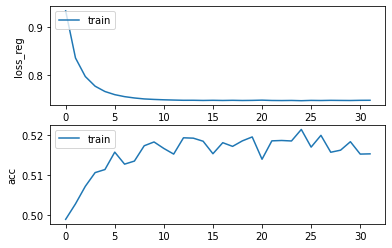

Epochs :  31 Iterations :  12256 Loss :  0.7466358193840744 ACC :  0.515343281292106 MCC :  0.03120495917095606 Precision :  0.5218112861285322
mode : validation


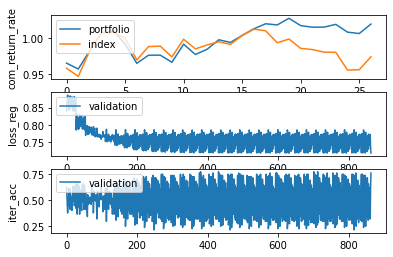

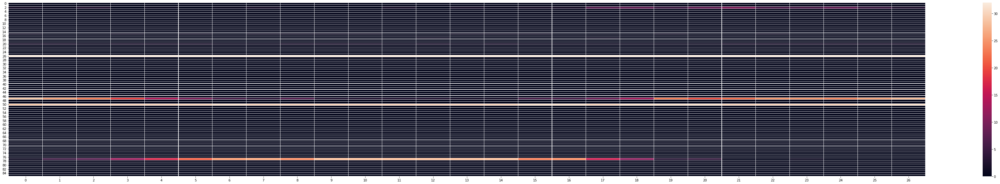

Epochs :  31 Iterations :  27 Loss :  0.7482313579983182 ACC :  0.5045751774752582 MCC :  nan Precision :  0.49463549642651167


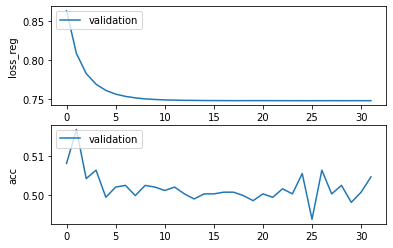

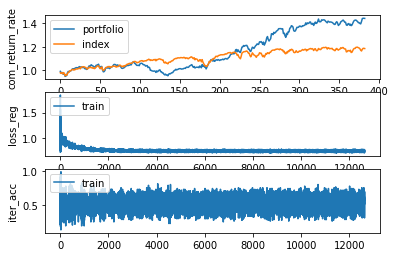

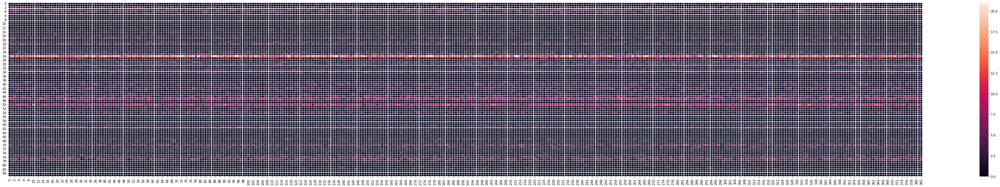

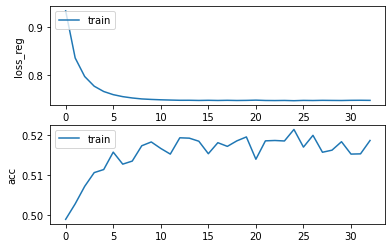

Epochs :  32 Iterations :  12639 Loss :  0.7464255211247477 ACC :  0.5186914614068622 MCC :  0.04059443703968705 Precision :  0.5243991685608115
mode : validation


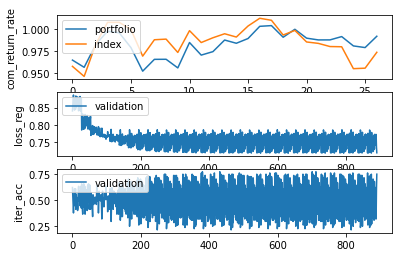

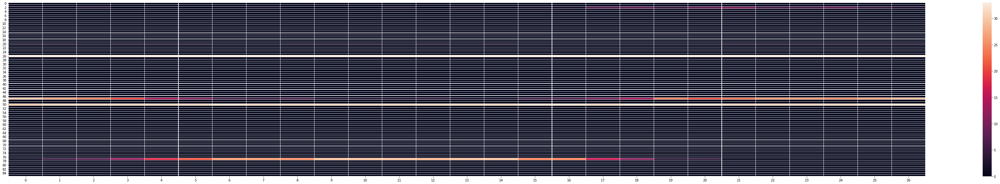

Epochs :  32 Iterations :  27 Loss :  0.748165488243103 ACC :  0.5019607990980148 MCC :  nan Precision :  0.49488787739365186


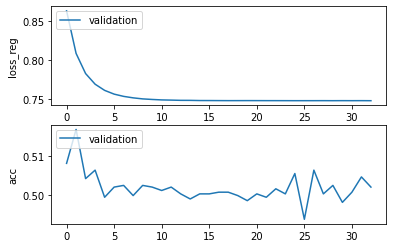

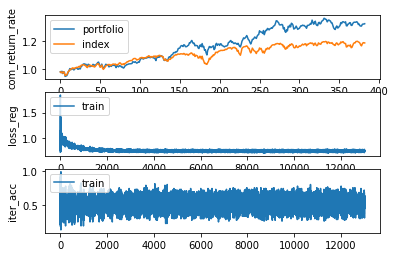

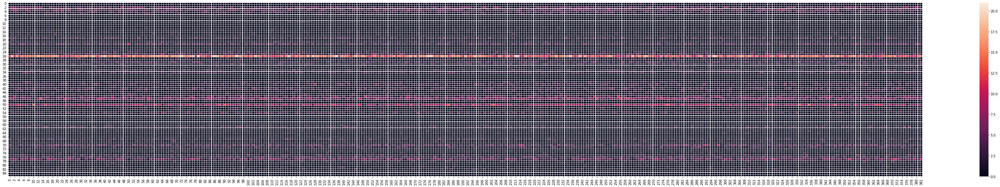

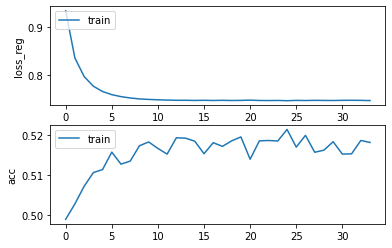

Epochs :  33 Iterations :  13022 Loss :  0.7460118915020019 ACC :  0.5181999859392799 MCC :  0.034980424718722196 Precision :  0.523902375654709
mode : validation


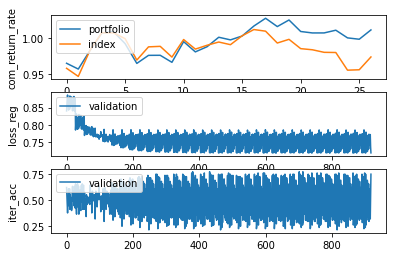

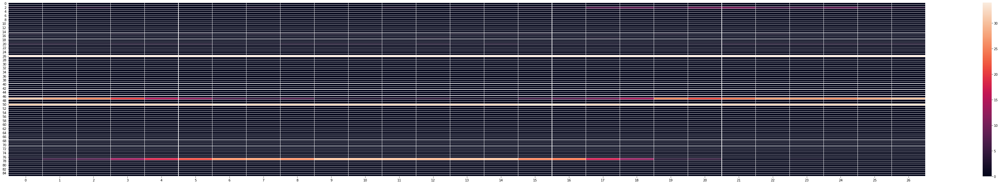

Epochs :  33 Iterations :  27 Loss :  0.7482234526563574 ACC :  0.4997821494385048 MCC :  nan Precision :  0.4942013338484146


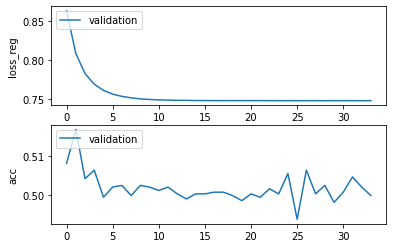

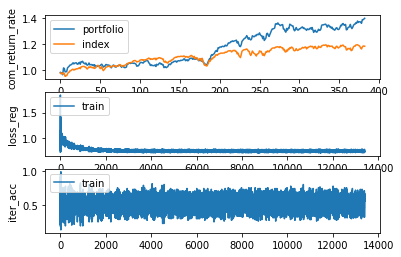

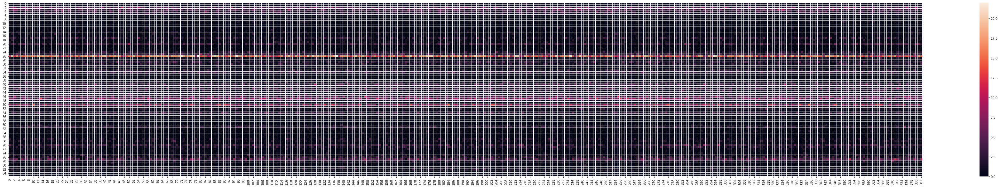

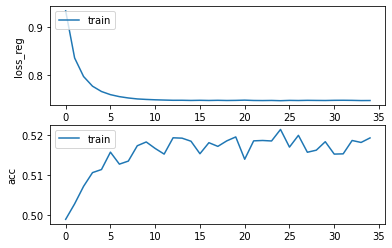

Epochs :  34 Iterations :  13405 Loss :  0.746113531583283 ACC :  0.5193365240377172 MCC :  0.03402555524918686 Precision :  0.5233017568216312
mode : validation


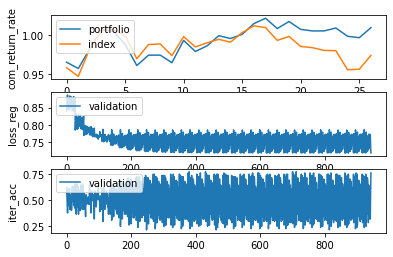

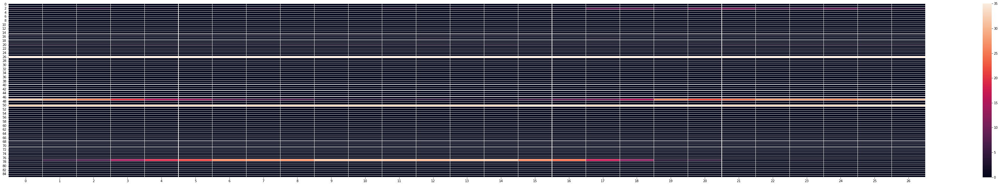

Epochs :  34 Iterations :  27 Loss :  0.7482808894581265 ACC :  0.501525068172702 MCC :  nan Precision :  0.49515686874036435


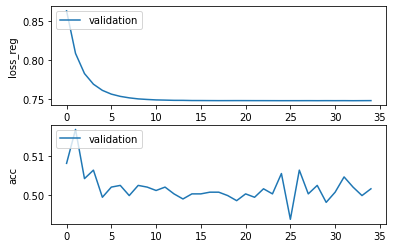

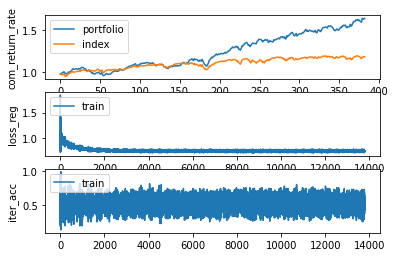

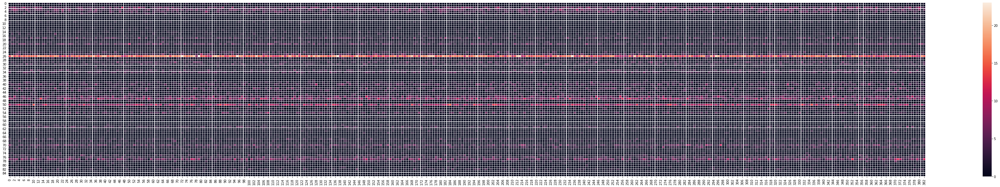

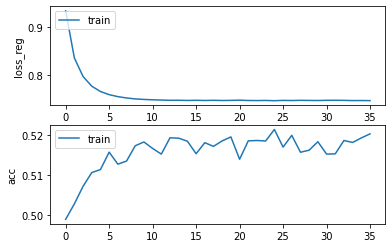

Epochs :  35 Iterations :  13788 Loss :  0.7459219522949299 ACC :  0.5203501926467562 MCC :  0.04013744565018747 Precision :  0.525058181917504
mode : validation


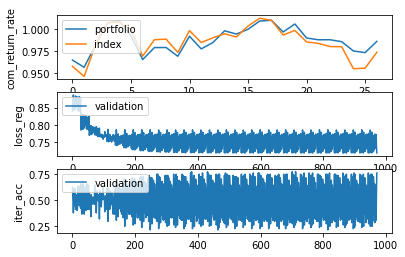

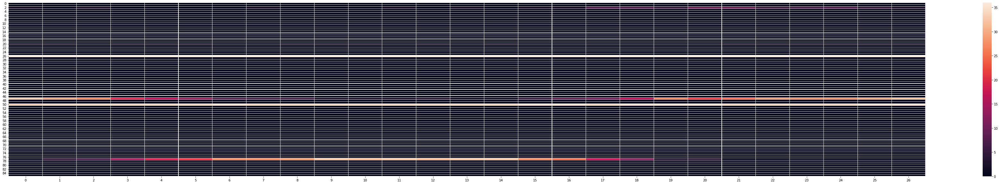

Epochs :  35 Iterations :  27 Loss :  0.7482264571719699 ACC :  0.5023965278157482 MCC :  nan Precision :  0.4958012201995761


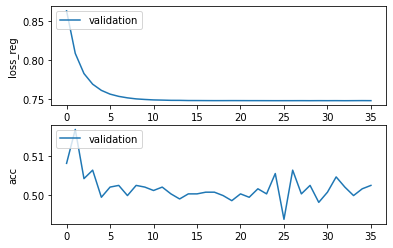

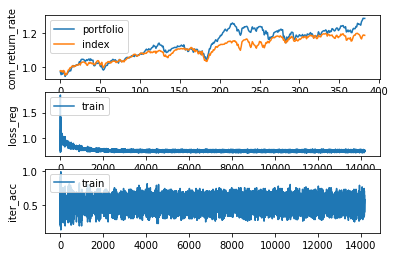

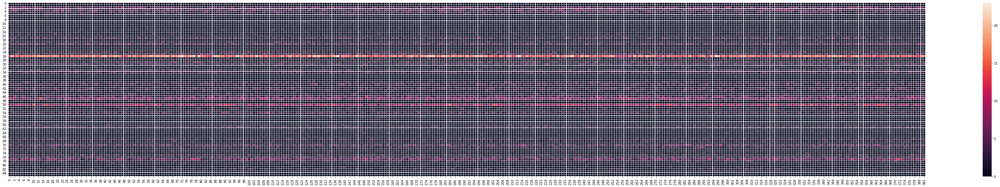

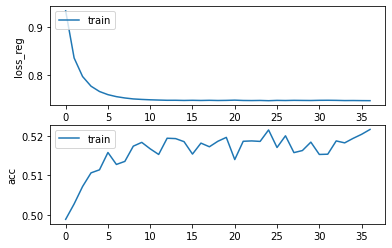

Epochs :  36 Iterations :  14171 Loss :  0.7458091172786045 ACC :  0.5215788827552497 MCC :  0.04244313252039312 Precision :  0.525062186560805
mode : validation


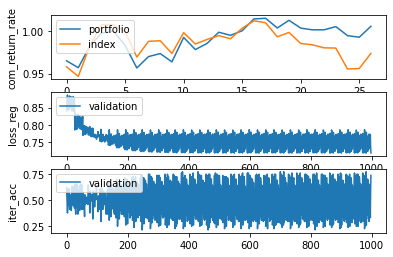

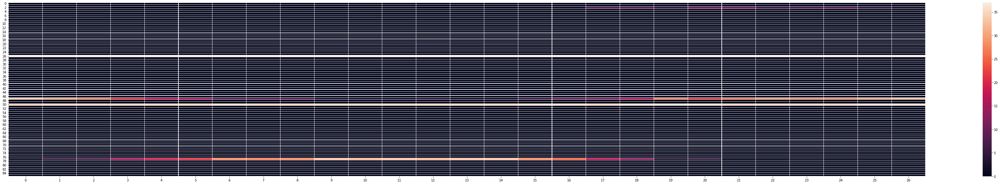

Epochs :  36 Iterations :  27 Loss :  0.7482647189387569 ACC :  0.5015250687245969 MCC :  nan Precision :  0.49394602162970436


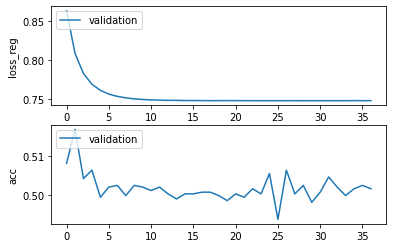

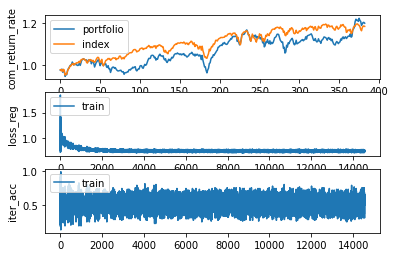

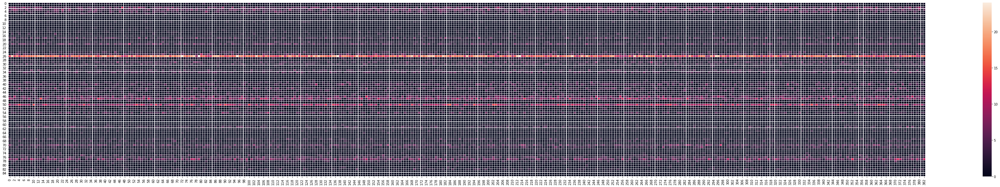

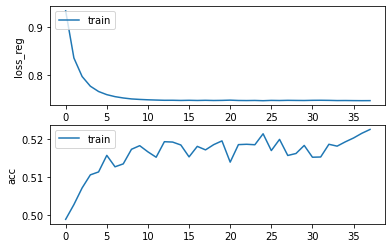

Epochs :  37 Iterations :  14554 Loss :  0.7458978830678656 ACC :  0.5225925521813236 MCC :  0.04156434754874465 Precision :  0.5253273484396794
mode : validation


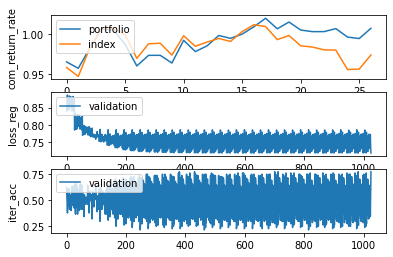

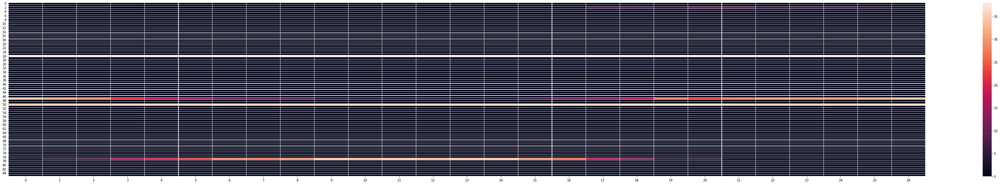

Epochs :  37 Iterations :  27 Loss :  0.7482567584073102 ACC :  0.5028322576372711 MCC :  nan Precision :  0.4940033219064827


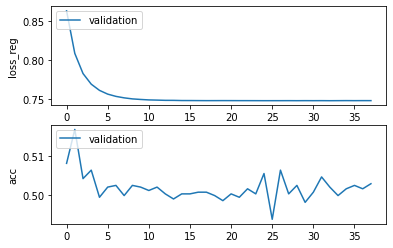

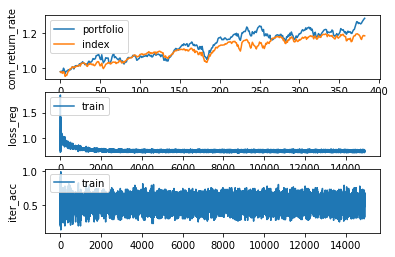

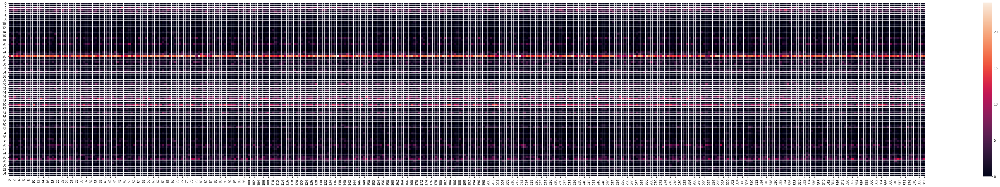

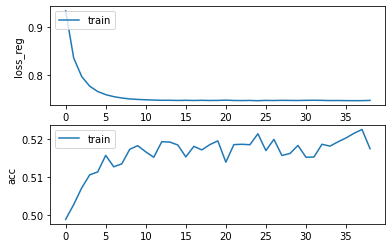

Epochs :  38 Iterations :  14937 Loss :  0.7463357405002684 ACC :  0.5175242055956439 MCC :  0.029506402028184723 Precision :  0.5216246124152726
mode : validation


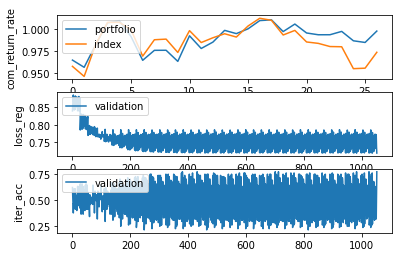

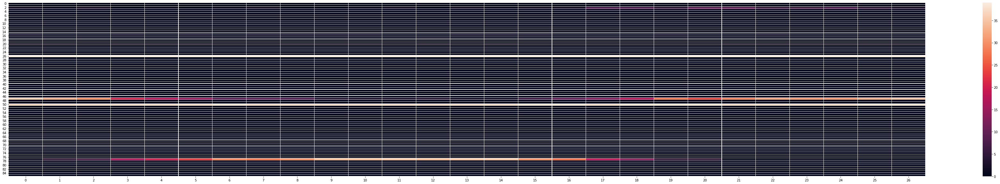

Epochs :  38 Iterations :  27 Loss :  0.7481677951636138 ACC :  0.49934642016887665 MCC :  nan Precision :  0.49402250239142664


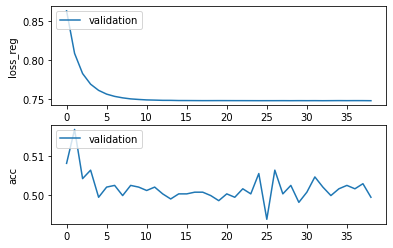

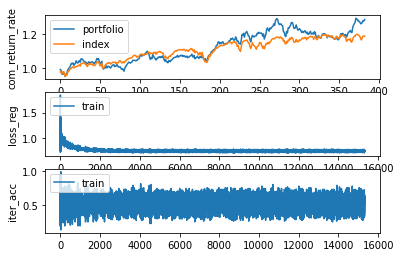

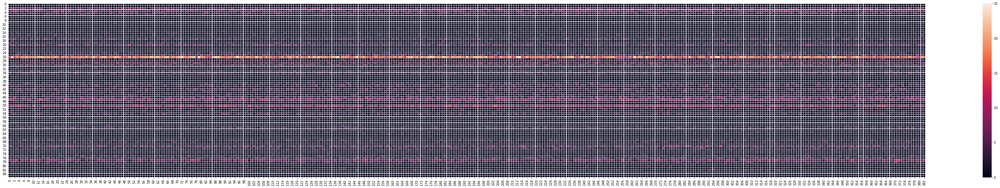

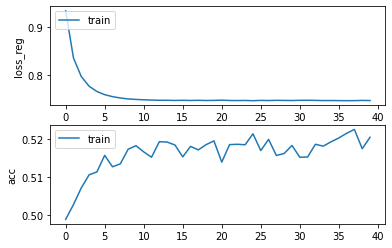

Epochs :  39 Iterations :  15320 Loss :  0.746051752069289 ACC :  0.5205344963945234 MCC :  0.03994870945165668 Precision :  0.5238711666510326
mode : validation


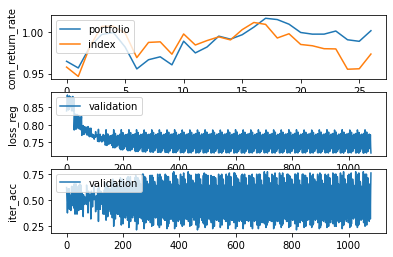

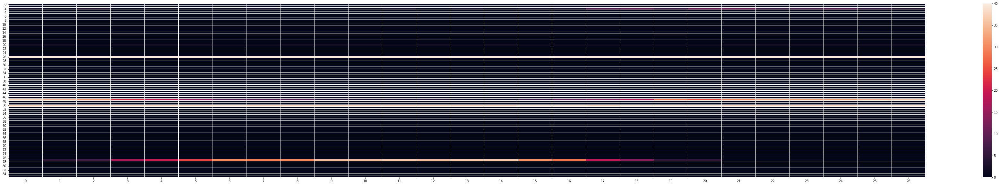

Epochs :  39 Iterations :  27 Loss :  0.7482321990860833 ACC :  0.5050109078486761 MCC :  nan Precision :  0.49563187802279435


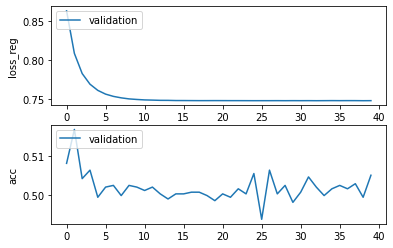

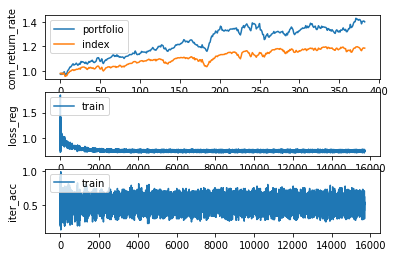

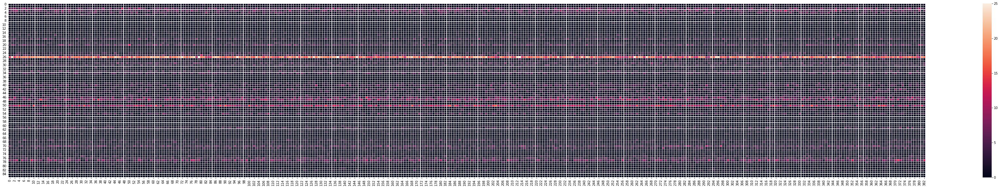

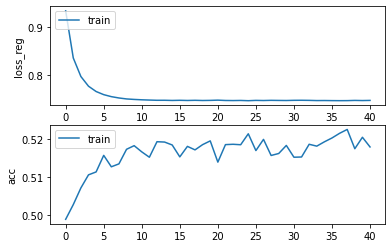

Epochs :  40 Iterations :  15703 Loss :  0.74635269483138 ACC :  0.5179849652179539 MCC :  0.03469047657890104 Precision :  0.5229195515739467
mode : validation


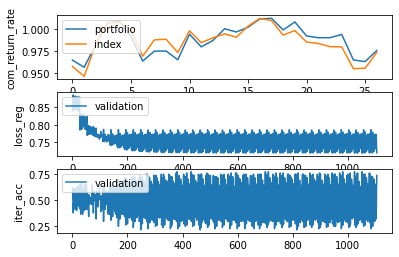

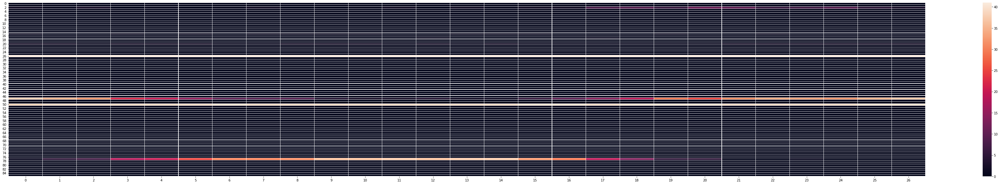

Epochs :  40 Iterations :  27 Loss :  0.7481698658731248 ACC :  0.5015250687245969 MCC :  nan Precision :  0.4953856991121062


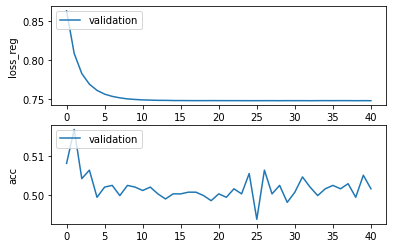

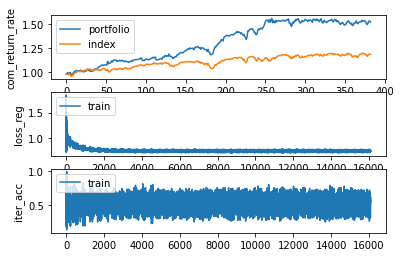

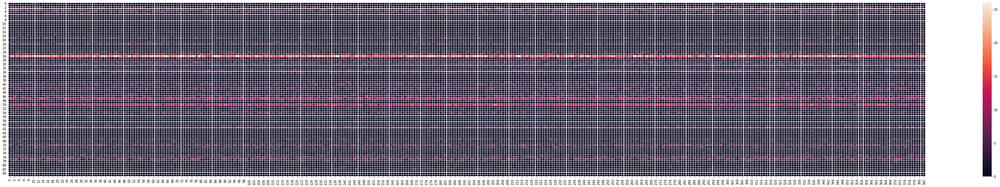

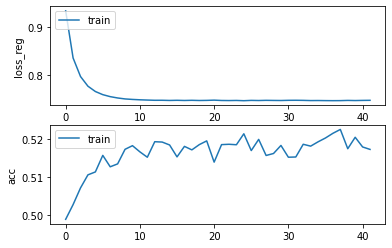

Epochs :  41 Iterations :  16086 Loss :  0.7465395082381624 ACC :  0.5173399021202217 MCC :  0.029552054107426264 Precision :  0.5218372237588967
mode : validation


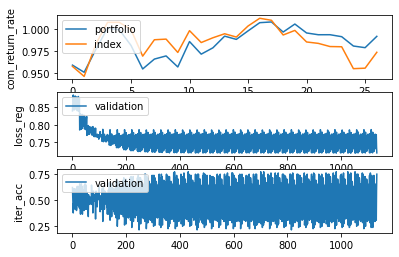

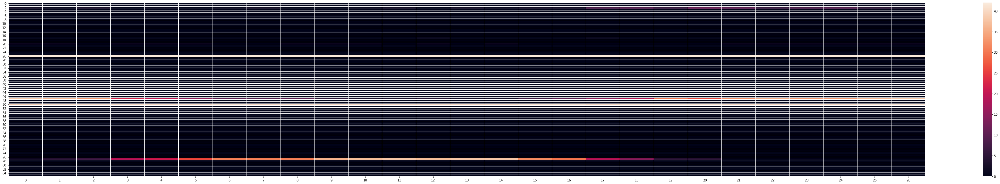

Epochs :  41 Iterations :  27 Loss :  0.7482131962422971 ACC :  0.4976034997789948 MCC :  nan Precision :  0.4922607415528209


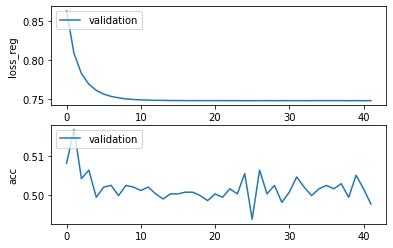

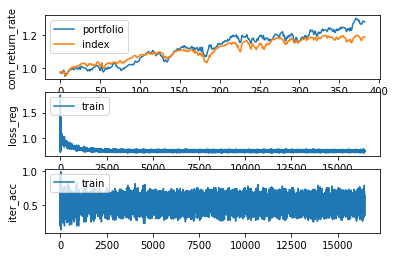

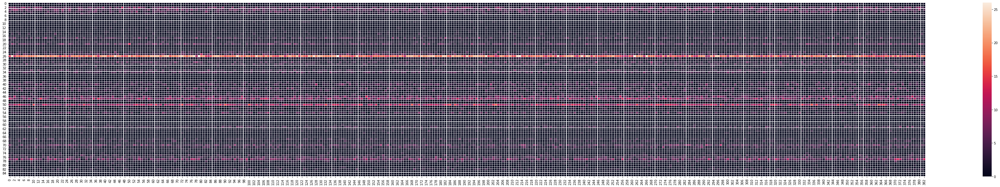

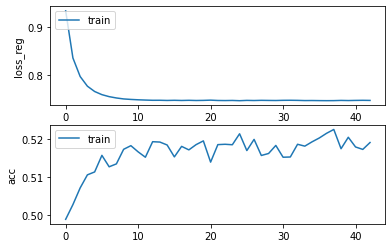

Epochs :  42 Iterations :  16469 Loss :  0.7463305063409531 ACC :  0.5191522198619792 MCC :  0.035839649269906876 Precision :  0.5230258646817494
mode : validation


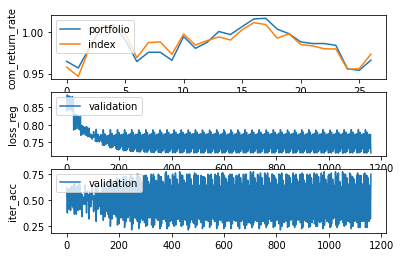

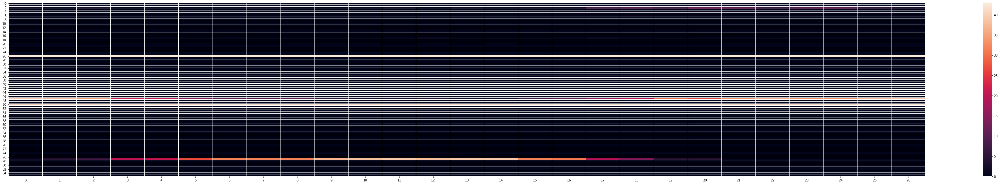

Epochs :  42 Iterations :  27 Loss :  0.7482609196945473 ACC :  0.4993464190650869 MCC :  nan Precision :  0.49257440085488335


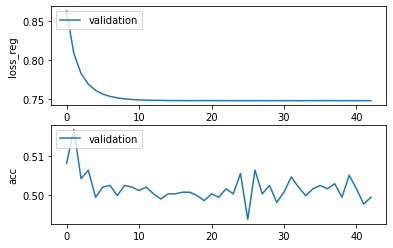

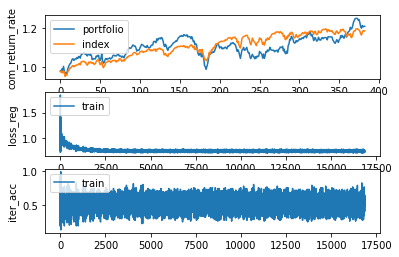

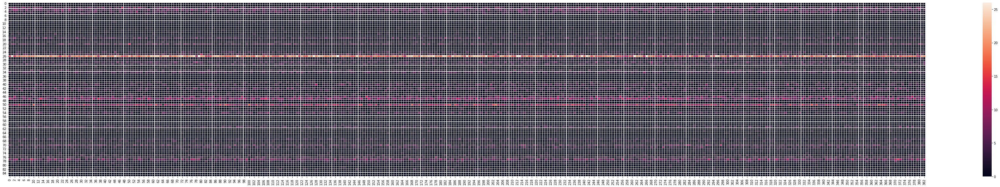

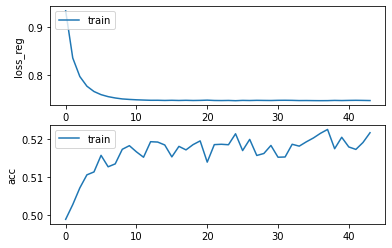

Epochs :  43 Iterations :  16852 Loss :  0.7460487080305115 ACC :  0.5217324694516453 MCC :  0.03725583404719018 Precision :  0.5240872499749415
mode : validation


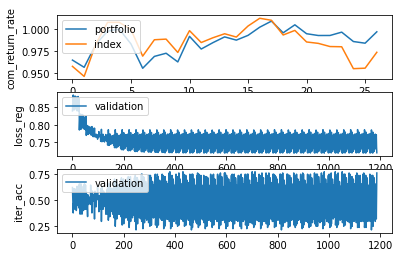

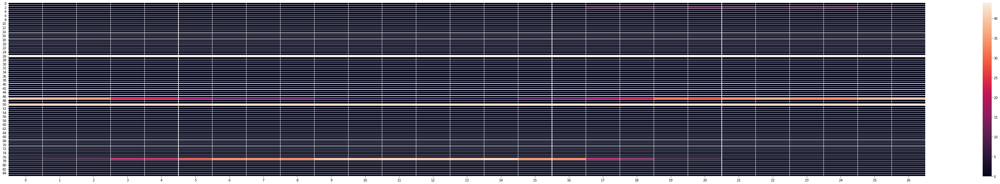

Epochs :  43 Iterations :  27 Loss :  0.7481846875614591 ACC :  0.5023965278157482 MCC :  nan Precision :  0.4948691555333358


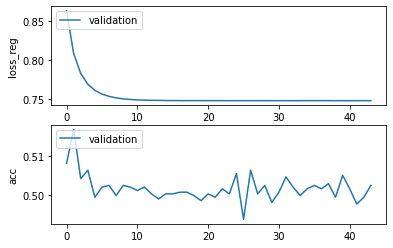

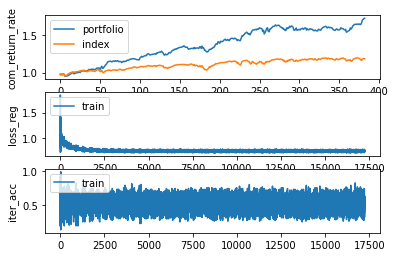

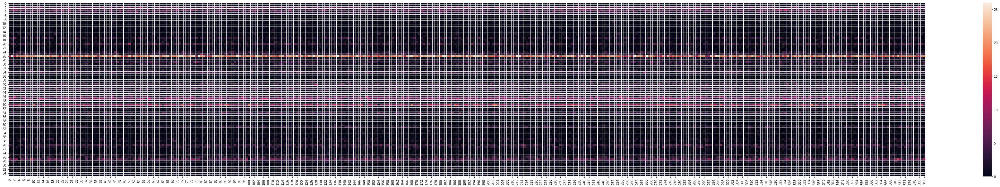

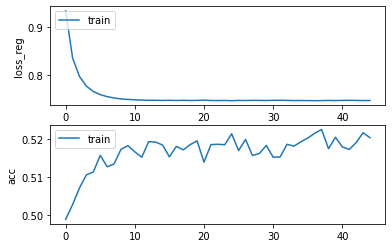

Epochs :  44 Iterations :  17235 Loss :  0.7462157944786331 ACC :  0.5204116275665343 MCC :  0.03983143225583362 Precision :  0.523475244062571
mode : validation


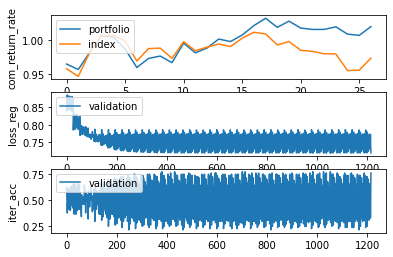

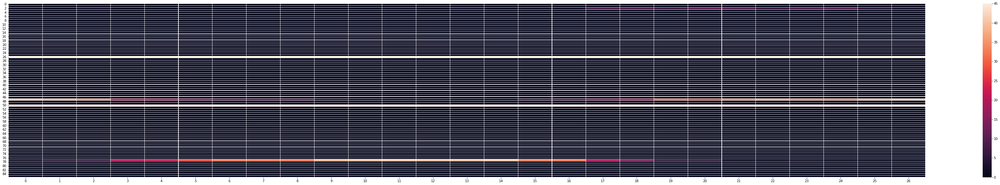

Epochs :  44 Iterations :  27 Loss :  0.7481764643280594 ACC :  0.5023965278157482 MCC :  nan Precision :  0.4942318672935168


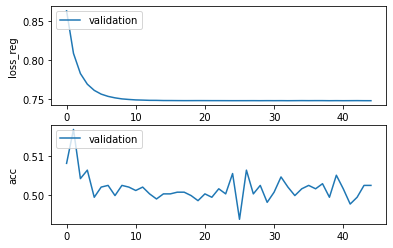

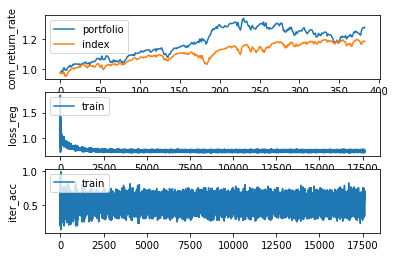

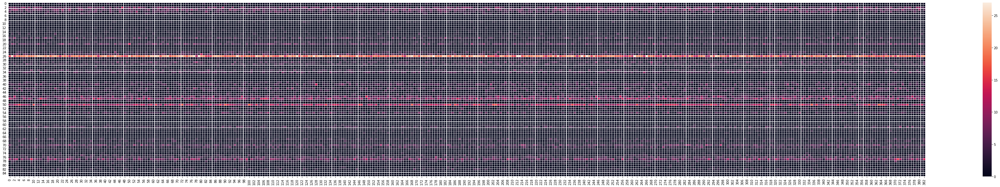

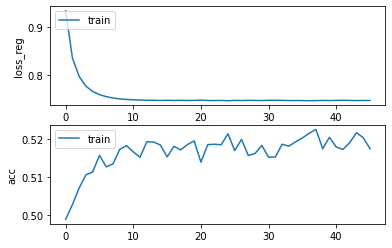

Epochs :  45 Iterations :  17618 Loss :  0.7461984649339481 ACC :  0.5174934893224009 MCC :  0.0337287351838921 Precision :  0.523453147011972
mode : validation


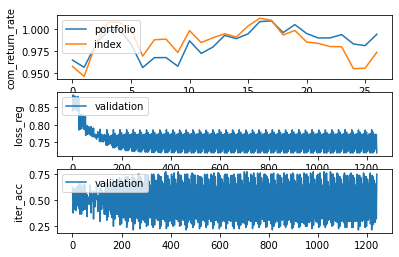

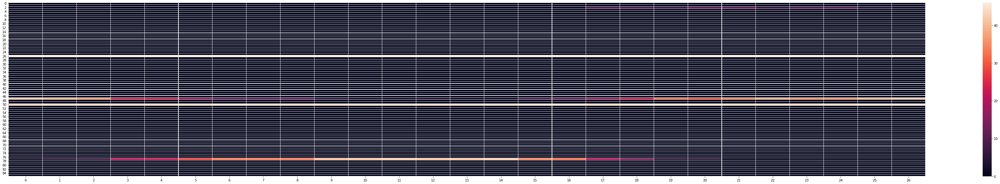

Epochs :  45 Iterations :  27 Loss :  0.7481792745766817 ACC :  0.49847496052583057 MCC :  nan Precision :  0.49250440851405813


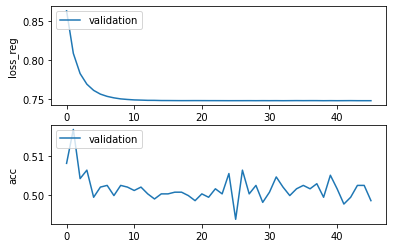

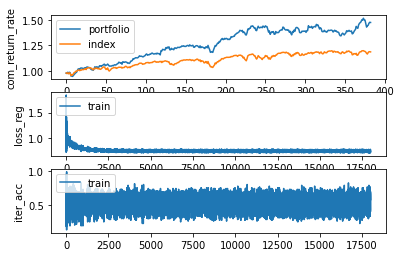

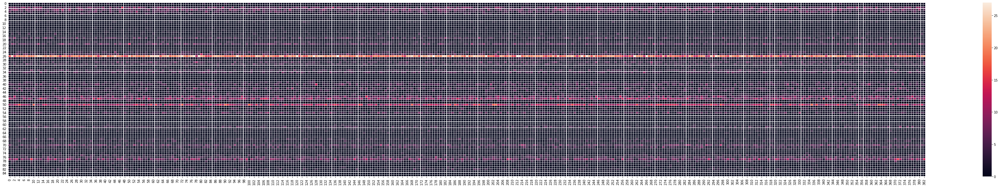

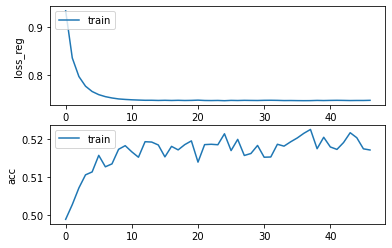

Epochs :  46 Iterations :  18001 Loss :  0.7465260014832797 ACC :  0.5171863155794517 MCC :  0.030292412674044776 Precision :  0.5209135232303612
mode : validation


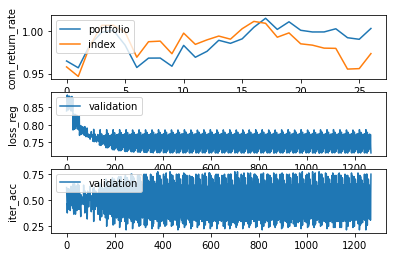

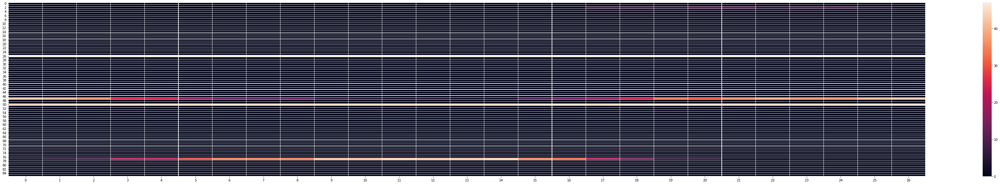

Epochs :  46 Iterations :  27 Loss :  0.7482669441788284 ACC :  0.49934642016887665 MCC :  nan Precision :  0.49230918302028265


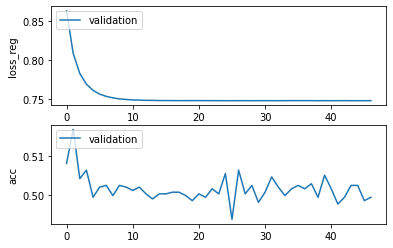

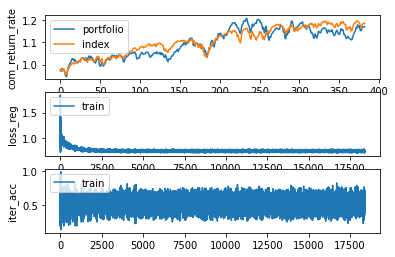

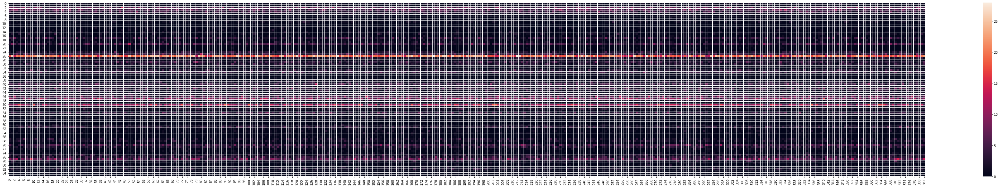

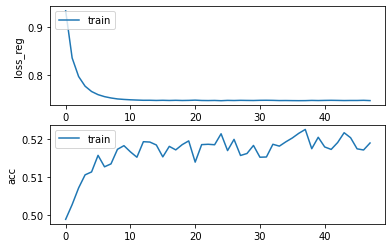

Epochs :  47 Iterations :  18384 Loss :  0.745958626892797 ACC :  0.5190293515397737 MCC :  0.032486213742288474 Precision :  0.5224448567251468
mode : validation


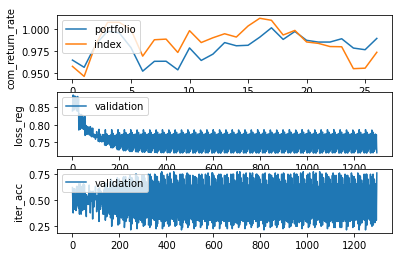

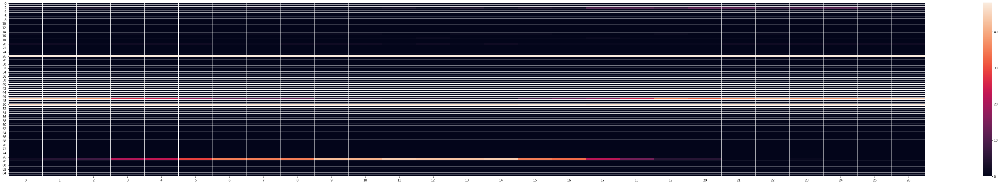

Epochs :  47 Iterations :  27 Loss :  0.7482889493306478 ACC :  0.4980392301524127 MCC :  nan Precision :  0.4928736264506976


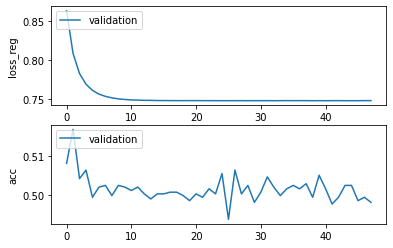

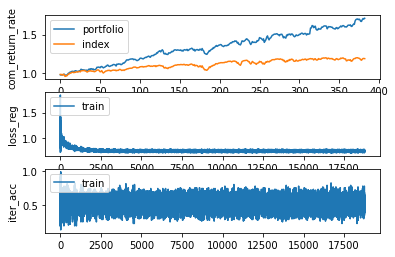

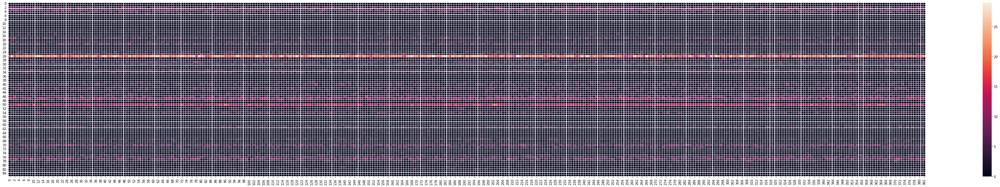

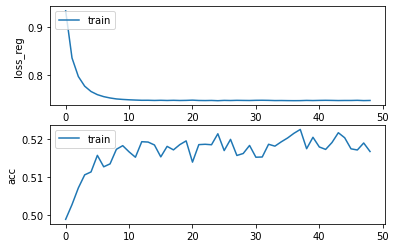

Epochs :  48 Iterations :  18767 Loss :  0.7462399138171741 ACC :  0.5167869915383292 MCC :  0.03492690639797715 Precision :  0.5229254272661851
mode : validation


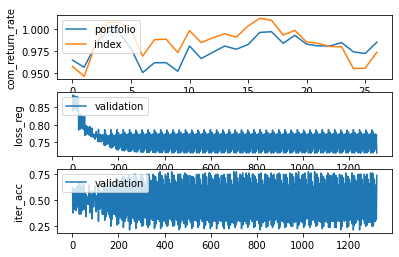

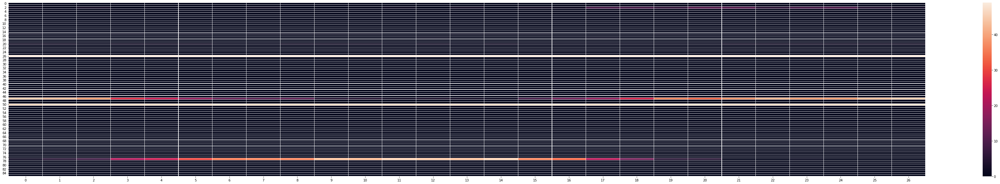

Epochs :  48 Iterations :  27 Loss :  0.7483218113581339 ACC :  0.4993464190650869 MCC :  nan Precision :  0.4943282816007181


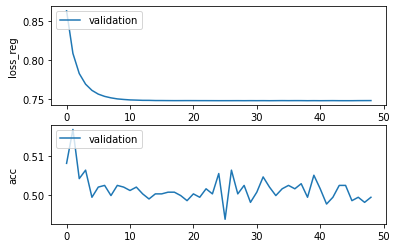

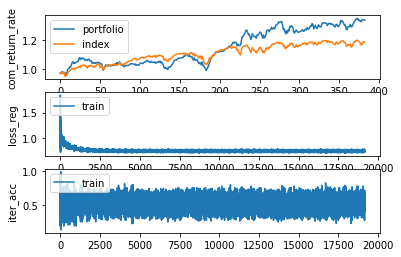

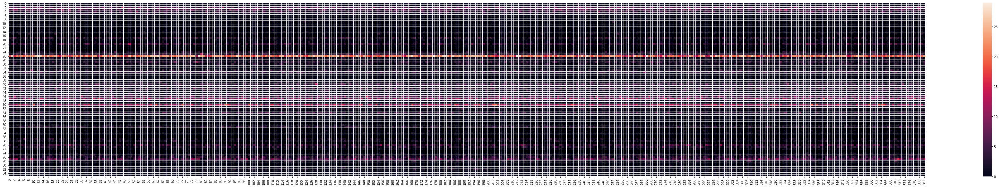

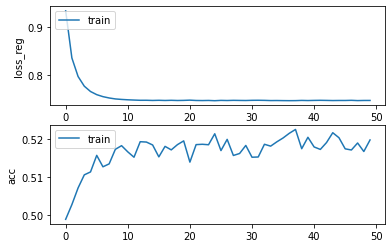

Epochs :  49 Iterations :  19150 Loss :  0.7462681170854494 ACC :  0.5198279998165509 MCC :  0.037353299040828805 Precision :  0.523727389417258
mode : validation


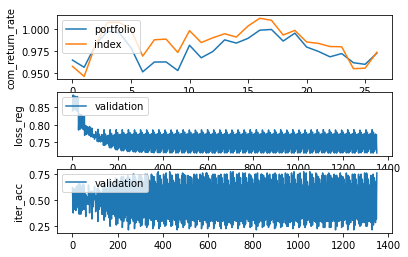

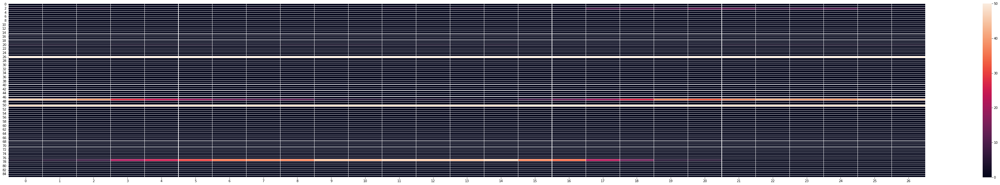

Epochs :  49 Iterations :  27 Loss :  0.7482922673225403 ACC :  0.49934642016887665 MCC :  nan Precision :  0.4930790494437571


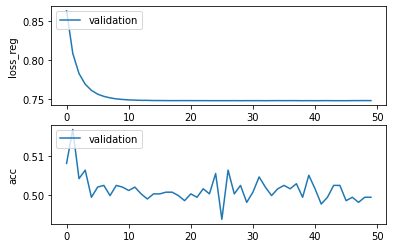

In [29]:
model.train()

mode : test
epoch :  0 time_idx :  0 loss_reg :  tensor(0.7282, grad_fn=<AddBackward0>) acc :  tensor(0.6824) mcc :  tensor(0.1035) precision :  tensor(0.9153)


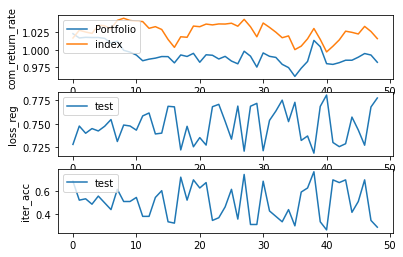

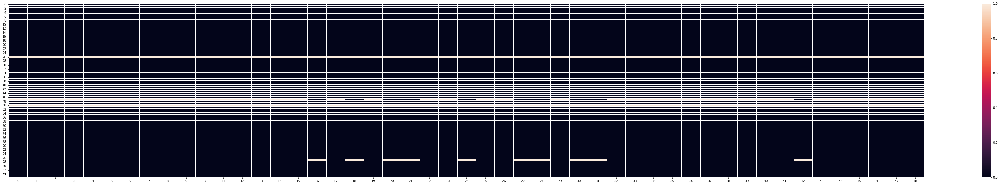

Epochs :  0 Iterations :  49 Loss :  0.7481925840280494 ACC :  0.5001200638255294 MCC :  0.02355712787153161 Precision :  0.48111162684401687


In [30]:
model.test()

mode : test
epoch :  0 time_idx :  0 loss_reg :  tensor(0.7277, grad_fn=<AddBackward0>) acc :  tensor(0.6941) mcc :  tensor(0.1135) precision :  tensor(0.9167)


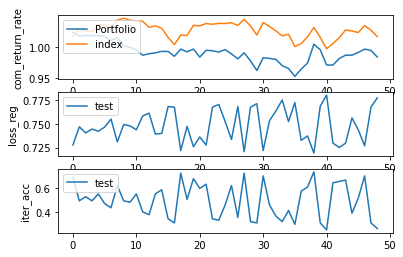

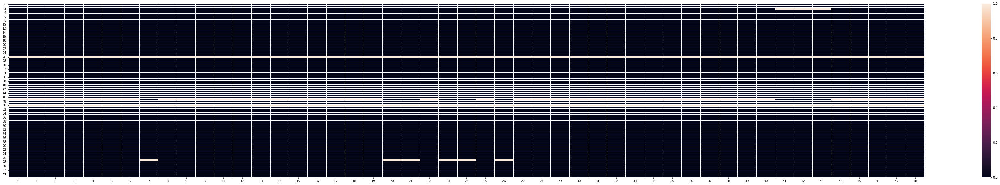

Epochs :  0 Iterations :  49 Loss :  0.7481770710069306 ACC :  0.4936374690459699 MCC :  0.012961623401438095 Precision :  0.4778462605816977


In [31]:
model.test()